# Fault development (WT01)

The notebook contains fault development analysis using vibration data from WT04. The analysis is mostly done using unsupervised machine learning techniques.

In [1]:
#### Looking at the following intervals in the traditional analysis:
intervals_wt01 = [3, 98, 204, 301, 407]
intervals_wt02 = [7, 101, 213, 293, 413]
intervals_wt03 = [1, 102, 199, 301, 411]
intervals_wt04 = [4, 102, 198, 306, 423]

In [2]:
%load_ext autoreload

In [3]:
%autoreload 2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import sys, os,os.path
from scipy import stats
import glob # To count files in folder
import os.path
import progressbar
from tqdm.notebook import tqdm
from math import pi
from numpy.fft import rfftfreq, rfft
from scipy.fftpack import next_fast_len
from scipy.signal import spectrogram
from sklearn.preprocessing import MinMaxScaler
import seaborn as sns
from IPython.display import Markdown

ROOT_PATH = os.path.abspath("..").split("data_processing")[0]
module_paths = []
module_paths.append(os.path.abspath(os.path.join(ROOT_PATH+"/data_processing/")))
module_paths.append(os.path.abspath(os.path.join(ROOT_PATH+"/hybrid_analysis_process_functions/")))
module_paths.append(os.path.abspath(os.path.join(ROOT_PATH+"/utils/")))
for module_path in module_paths:
    if module_path not in sys.path:
        print("appended")
        sys.path.append(module_path)

import functions as f
import wt_data, ff_transform, explore_fft_time_data, envelope, build_dataset,\
load_raw_signals, envelope, envelope_emd,plotting_methods,\
resample_signals, filter_signals, plotting_methods,filters,correlation_coeff,\
clustering,feature_extraction,polycoherence,plot_eemd,correlation_plot


appended
appended
appended
ROOT /Users/stianismar/Dropbox/gitProsjekter/master-thesis/src
/Users/stianismar/Dropbox/gitProsjekter/master-thesis/src
ROOT /Users/stianismar/Dropbox/gitProsjekter/master-thesis/src
ROOT /Users/stianismar/Dropbox/gitProsjekter/master-thesis/src
ROOT /Users/stianismar/Dropbox/gitProsjekter/master-thesis/src


In [4]:
c, p = f.color_palette()
sns.set(context='paper', style='whitegrid', palette=np.array(p))
plt.style.use(ROOT_PATH+"/utils/plotparams.rc")

In [5]:
vib_signal, times, op_data_intervals, _ = load_raw_signals.load_raw('gearbox','wt03')

File exist


In [ ]:
vib_signal.shape

In [6]:
# SLOW: Find out which indexes to remove:
remove_these = build_dataset.find_indexes_to_remove('WTG03')


Loading WTG03...
Loaded WTG03


In [155]:
wt_num=3
df_times_unfiltered = pd.read_csv('/Volumes/OsvikExtra/signal_data/raw_data/gearbox/wt03/interval_dates_wt03.csv')

In [156]:
display(Markdown(f'<span style="color: #2a9d8f; font-size: 20px">Index 350 corresponds to {df_times_unfiltered.iloc[350].Date}:</span>'))

<span style="color: #2a9d8f; font-size: 20px">Index 350 corresponds to 2019-08-28 15:42:10:</span>

In [11]:
df_times = pd.read_csv('/Volumes/OsvikExtra/signal_data/raw_data/gearbox/wt03/interval_dates_wt03.csv')

In [12]:
# Removing the indexes that weren't in the other op dataset.
if(op_data_intervals.shape[0] != df_times.shape[0]):
    print('removing')
    remove_these=np.flip(remove_these)
    for index in remove_these:
        df_times = df_times.drop([df_times.index[index]])
df_times.shape
df_times = df_times.reset_index(drop=True)

try: 
    # df_times = df_times.drop(['index','Unnamed: 0'],axis=1)
    df_times = df_times.drop(['level_0'],axis=1)
except: 
    print('Could not remove')

removing
Could not remove


Adding dates to a new df.

In [13]:
dates=pd.DataFrame(df_times['Date'],columns=['Date'])

formatted_dates = []

for d in dates['Date']:
    formatted_dates.append((d.split(' ')[0][:7]))
new_df=op_data_intervals
new_df['Date'] = formatted_dates

In [14]:
# The df times which is cleaned.
df_times

,Unnamed: 0,Date
0,0,2018-08-04 18:17:44
1,0,2018-08-04 20:22:58
2,0,2018-08-05 11:57:41
3,0,2018-08-10 13:14:02
4,0,2018-08-13 10:19:11
...,...,...
410,0,2019-10-27 15:57:53
411,0,2019-10-28 15:08:00
412,0,2019-10-29 02:54:48
413,0,2019-10-29 06:55:27


In [15]:
op_data_intervals.shape[0]

415

In [ ]:
p1=sns.color_palette("RdBu", n_colors=8)[2:-2]
p2=sns.color_palette("RdBu_r", n_colors=7)
p3=sns.color_palette("RdBu", n_colors=5)[1:-3]
new_palette=p1+p2+p3[0:-1]+[p2[5]]+[p1[0]]+[p1[1]]+[p1[2]]
sns.palplot(new_palette)
print("aug       sept     okt     nov    des     jan     feb     mars   april   mai    juni   juli   august  sept    octo")

In [ ]:
number_of_boxplots = len(result.groupby('Date').nunique())
number_of_boxplots

In [ ]:
import datetime
input1 = '23/12/2011'
my_date = datetime.datetime.strptime(input1, "%d/%m/%Y")
print(my_date.strftime("%d %b, %Y")) # 23 Dec, 2011

In [16]:
# Hardcode some seasonal colours

def plot_season_groups(df,features_to_plot,wtnum):
    
    df['Month'] = df['Date']

    '''
    p1=sns.color_palette("RdBu", n_colors=6)
    p2=sns.color_palette("RdBu_r", n_colors=7)
    p3=sns.color_palette("RdBu", n_colors=6)[1:-1]
    new_palette=p1[0:-2]+p2+p3
    '''
    
    # Season colors
    p1=sns.color_palette("RdBu", n_colors=8)[2:-2]
    p2=sns.color_palette("RdBu_r", n_colors=7)
    p3=sns.color_palette("RdBu", n_colors=5)[1:-3]
    new_palette=p1+p2+p3[0:-1]+[p2[5]]+[p1[0]]+[p1[1]]+[p1[2]]
    
    number_of_boxplots = len(result.groupby('Date').nunique())
            
    for i in range(len(features_to_plot)):
        feat = features_to_plot[i]
    
        # formatting title
        if (len(feat.split('_'))>2):
            feat_name=(str(feat.split('_')[0])+ '\_' + str(feat.split('_')[1])+ '\_' + str(feat.split('_')[2]))
        elif (len(feat.split('_'))>1):
            feat_name=(str(feat.split('_')[0])+ '\_' + str(feat.split('_')[1]))
        else:
            feat_name=feat
        fig = plt.figure(figsize=(15, 5))
        plot=sns.violinplot(data=df, x='Month', y=features_to_plot[i], palette=new_palette)
        
        # Calculate number of obs per group & median to position observation number
        medians = df.groupby('Date')[feat].median().values
        nobs = df['Date'].value_counts().values # number of observations for feature
        nobs = [int(x) for x in nobs.tolist()]
        # nobs = ["n: " + i for i in nobs]
        #nobs = ["N = " + i for i in nobs]
        print(nobs)
        # Add it to the plot
        pos = range(len(nobs))
        
        
        labels=plot.get_xticklabels()

        nobs = [f"N = {nobs[i]}\n {labels[i].get_text()}" for i in pos]

        plot.set_xticklabels(nobs)
        
        #for tick,label in zip(pos,plot.get_xticklabels()):
            #print(label)
            #plot.text(pos[tick], medians[tick] + 0.03, nobs[tick], horizontalalignment='center', size='large', color='black', weight='semibold')


        
        # plot = sns.swarmplot(data=df, x='Month', y=features_to_plot[i], color=".25")
        plt.xticks(rotation=45)
        plt.style.use(ROOT_PATH+"/utils/plotparams.rc")
        plt.title(f"WT0{wtnum}: Grouping "+ r"$\bf{"+str(feat_name)+"}$" +" by month")
        # plt.ylabel(ylabels[i])
        plt.xlabel('Month and number of samples (N)')
        
        '''

        if features_to_plot[i]=='WindSpeed':
            plt.ylim(3,30)

        if features_to_plot[i]=='AvgSpeed':
            plt.ylim(600,1650)

        if features_to_plot[i]=='AvgPower':
            plt.ylim(300,4000)
        '''
        plt.tight_layout()

        # Saving
        save_path=f'../../plots/features/'
        plt.savefig(f'{save_path}/grouped_by_month/{wtnum}_{features_to_plot[i]}.png',dpi=300)

        plt.show()

        
# features_to_plot = ['AvgPower', 'WindSpeed', 'AvgSpeed']        
# plot_season_groups(new_df,features_to_plot,4)

### EEMD and Bi-spectrum inspection

In [ ]:
raw_imfs_path='/Volumes/OsvikExtra/signal_data/raw_data/gearbox/wt03/eemds_wt03/'
file_count = len(glob.glob1(raw_imfs_path,"*.zip"))
print(file_count)

## Plotting an EEMD:

In [ ]:
new_row = [{'name':1, 'physics':87, 'chemistry':92, 'algebra':97}]
new_row2 = [{'name':1, 'physics':87, 'chemistry':92, 'algebra':97}]
df1=pd.DataFrame(new_row)
df2=pd.DataFrame(new_row2)

pd.concat([df1,df2])

In [ ]:
a=np.array(vib_signal[1][0:20000])
envelope_emd.eemd('WT03',1,'HSS Gearbox', a,times[1][0:20000])

In [ ]:

intervals = [4, 102, 198, 306, 423]
# fig1, axs = plt.subplots(2,2, figsize=(15, 20), facecolor='w', edgecolor='k')
#axs=axs.flatten()
for i,interval_num in enumerate(intervals):
    # reading form file
    imf_df=pd.read_csv(raw_imfs_path+f'raw_wt03_interval_number_{interval_num}.zip')
    timestamp_of_signal=df_times[df_times.index==interval_num]['Date'][interval_num]

    # plot_eemd.plot_imfs_and_kurtosis(raw_imfs_path,'eemd_wt04_interval_400',times,'zip',plot_num_intervals)
    plot_eemd.plot_n_imfs_and_kurtosis(1,imf_df,interval_num,timestamp_of_signal,f'eemd_wt03_interval_{interval_num}',times,'zip',number_to_print=6)
    #axs[i].


## Bi-spectrum

In [ ]:
print(f'The duration of the signal which bi-spectrum features are extracted \
from is {times[0][3000]}')

### Plotting one bi-spectrum with raw signal
This is plotted for comparison with the other wind turbines. This is based on the unfiltered signal.

In [ ]:


sig=vib_signal[0][0:3000]
fs = 25600

N=10000 # Select the N to split the signal into N parts
kw = dict(nperseg=N // 10, noverlap=N // 20, nfft=next_fast_len(N // 2))
freq1, fre2, bispec = polycoherence.polycoherence(sig, fs, norm=None, **kw)
polycoherence.plot_polycoherence(freq1, fre2, bispec)
plt.show()
print(bispec.shape)

bispec_half = np.triu(bispec) # remove symmetric part
polycoherence.plot_polycoherence(freq1, fre2, bispec_half)

plt.show()


sig=vib_signal[400][0:3000]
fs = 25600

N=10000 # Select the N to split the signal into N parts
kw = dict(nperseg=N // 10, noverlap=N // 20, nfft=next_fast_len(N // 2))
freq1, fre2, bispec = polycoherence.polycoherence(sig, fs, norm=None, **kw)
polycoherence.plot_polycoherence(freq1, fre2, bispec)
plt.show()
print(bispec.shape)

bispec_half = np.triu(bispec) # remove symmetric part
polycoherence.plot_polycoherence(freq1, fre2, bispec_half)

plt.show()


### Loading the HP signals (6000 Hz)
We need this signal for early fault detection, where the literature states that faulty characteristics first show up in the higher frequencies.

In [6]:
def load_6000_filtered(filtered_path):
    num_csvs = len([f for f in os.listdir(filtered_path) 
         if f.endswith('.csv') and os.path.isfile(os.path.join(filtered_path, f)) and f[0]=='f'])

    filtered_signals = []
    filtered_freqs = []
    columns = []
    for i in tqdm(range(num_csvs)):
        acc=pd.read_csv(filtered_path+'filtered_raw_6000_'+str(i)+'.csv')
        columns.append('filtered_' + str(i))
        filtered_signals.append(acc.values.T[0])
        filtered_freqs.append(acc.shape[0] / times[i][-1])
        print(f'Reading {i} / {num_csvs} files', end='\r')

    filtered_signals = np.asarray(filtered_signals)
    filtered_signals
    return filtered_signals

filtered_path = '/Volumes/OsvikExtra/signal_data/raw_filtered_6000Hz/gearbox/wt03/filtered/'
filtered_signals=load_6000_filtered(filtered_path)

Reading 414 / 415 files


### Plotting bi-spectrum for one interval (HP 6000 Hz filtered)
Since we are looking at the higher frequency bands, we want to use bi-spectrum features from these.

In [ ]:
def plot_bispec(wt_num,interval_num):
    fs=25600
    sig=filtered_signals[interval_num][0:3000] # selecting to be stationary

    N=20000 # Select the N to split the signal into N parts
    kw = dict(nperseg=N // 10, noverlap=N // 20, nfft=next_fast_len(N // 2))
    freq1, fre2, bispec = polycoherence.polycoherence(sig, fs, norm=None, **kw)
    # polycoherence.plot_polycoherence(freq1, fre2, bispec)
    # plt.show()
    # print(bispec.shape)

    bispec_half = np.triu(bispec) # remove symmetric part

    polycoherence.plot_polycoherence(freq1, fre2, bispec_half)
    var = df_times.iloc[interval_num]['Date']
    plt.title(f'WT0{wt_num}: Bispectrum plot HP filtered signal (interval {interval_num}).\n Date: {var}')
    SAVE_FILE_NAME = f'WT04_bispectrum_interval_{interval_num}'
    plt.savefig(f'../../plots/bispectrums/{SAVE_FILE_NAME}.png',dpi=200)
    plt.tight_layout()
    plt.show()
    
    
plot_interval1 = intervals_wt04[0]
plot_interval2 = intervals_wt04[-1]
    
plot_bispec(4,plot_interval1)

plot_bispec(4,plot_interval1)
plot_bispec(4,3)
plot_bispec(4,plot_interval2)

# Features

### Creating/Loading feature_df
Time domain: Statistical features
Frequency domain: Bi-spectrum features
Time-frequency domain: 5 first IMF features

In [26]:
wt_num=3
feature_df=feature_extraction.generate_feature_df(wt_num,25600,op_data_intervals,filtered_signals)


All features already exist. They are returned.


In [ ]:
feature_df.shape

In [14]:
feature_df[feature_df['WindSpeed']<0]

,Unnamed: 0,Index,AvgPower,ActPower,WindSpeed,NacelleDirection,AvgSpeed,rms,kurt,skewness,...,imf_entropy_1,imf_entropy_2,imf_entropy_3,imf_entropy_4,imf_entropy_5,imf_kurtosis_1,imf_kurtosis_2,imf_kurtosis_3,imf_kurtosis_4,imf_kurtosis_5


Removing fetures `['Unnamed: 0','NacelleDirection','entropy']` from `features_cleaned`

In [27]:
try:
    features_cleaned = feature_df.drop(['Unnamed: 0','NacelleDirection','entropy'],axis=1)
except:
    features_cleaned = feature_df.drop(['NacelleDirection','entropy'],axis=1)
#features_cleaned.Date

Boxplot of `features_cleaned`, just filtered on RPM 1450.

--- 10.802871942520142 seconds ---


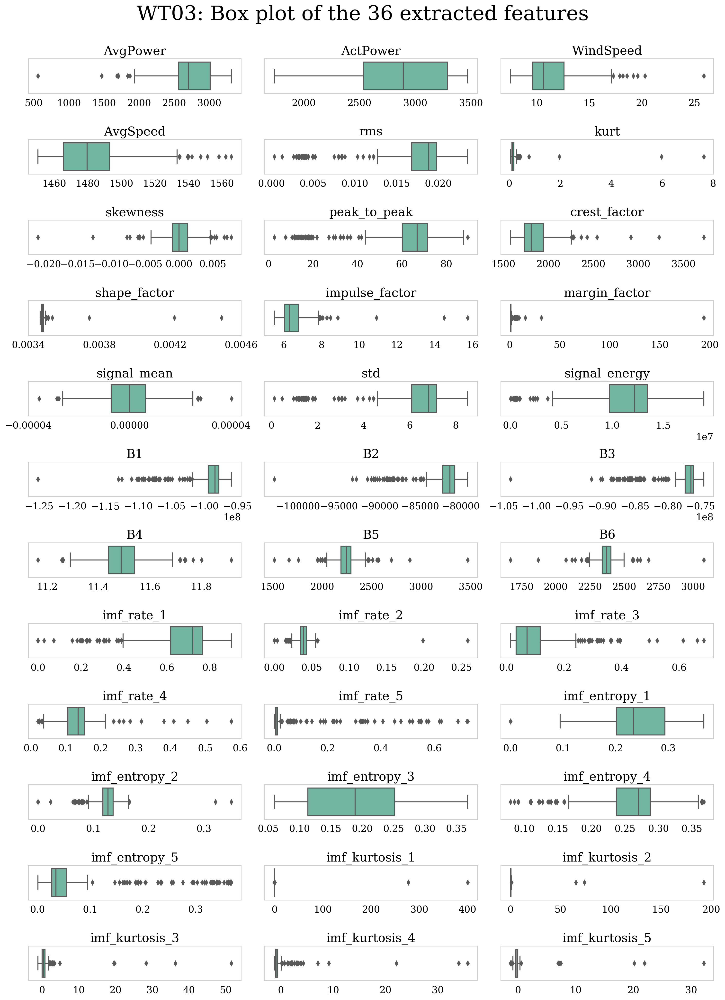

In [107]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.ticker as plticker


#first_half_features = features_cleaned.columns[:len(features_cleaned.columns)//2]
#second_half_features = features_cleaned.columns[len(features_cleaned.columns)//2:]

#subsets=[first_half_features,second_half_features]

import time
start_time = time.time()

fig,axs = plt.subplots(9,4,figsize=(15,23))

fig.suptitle(f"WT0{str(wt_num)}: Box plot of the 36 extracted features",fontsize=30)

fig.tight_layout()
# plt.subplots_adjust(top=0.96)

i=1
for column in features_cleaned:
    if (column == 'Index' or column== 'Date'):
        continue

    ax = fig.add_subplot(13,3,i)
    ax.set_title(column,fontsize=18)
    sns.boxplot(features_cleaned[column],palette="Set2")
    ax.set_xlabel('')
    ax.grid(False)

    if (column == 'shape_factor' or column=='signal_mean'):
        #loc = plticker.MultipleLocator(base=5) # this locator puts ticks at regular intervals
        #ax.xaxis.set_major_locator(loc)
        ax.set_xticks(ax.get_xticks()[::2])


    # Removing y ticks and y labels
    frame1 = plt.gca()
    frame1.axes.yaxis.set_ticklabels([])
    frame1.axes.get_yaxis().set_ticks([])

    for tick in ax.xaxis.get_major_ticks():
                tick.label.set_fontsize(14) 

    i+=1

# Remove the empty plots
flat = axs.flatten()
for a in flat:
    fig.delaxes(a)



# fig.subplots_adjust(hspace=0.9)
fig.tight_layout(rect=[0, 0.03, 1, 0.95])
print("--- %s seconds ---" % (time.time() - start_time))

fig.savefig(f"../../plots/box_plots/boxplot_WT0{str(wt_num)}.png",format='png',bbox_inches='tight')

plt.show()


Creating some latex tables of `features_cleaned`

In [23]:
def df_to_latex(dataframe,index=True):
    text =  dataframe.to_latex(index=index)
    return text

def head_row_col(dataframe):
    print_df = dataframe.head().iloc[:,[1,2,3,4,5]].copy()
    print_df["..."]="..."
    return print_df

In [ ]:
text1 = df_to_latex(feature_df[['AvgPower', 'ActPower', 'WindSpeed', 'AvgSpeed']].head().round(2))
print(text1)
print('##########')

dftime=head_row_col(feature_df[['rms', 'kurt',
       'skewness', 'peak_to_peak', 'crest_factor', 'shape_factor',
       'impulse_factor', 'margin_factor', 'signal_mean', 'std',
       'signal_energy']].head().round(4))

text2 = df_to_latex(dftime)
print(text2)

In [ ]:
i = 11
j = 1
a = np.zeros(shape=(i,j))
print(a.shape)
a=a.T
df = pd.DataFrame(data=a,columns=['rms', 'kurt',
       'skewness', 'peak_to_peak', 'crest_factor', 'shape_factor',
       'impulse_factor', 'margin_factor', 'signal_mean', 'std',
       'signal_energy'])
print(df_to_latex(df))


### Removing some noisy points in the ```imf_kurtosis_X``` and ```WindSpeed``` features
But first, removing some noisy data.

In [28]:
# Need to clean away these crazy points

print(np.asarray(features_cleaned[features_cleaned['imf_kurtosis_1']>5]['Index']))
print(np.asarray(features_cleaned[features_cleaned['imf_kurtosis_2']>5]['Index']))
print(np.asarray(features_cleaned[features_cleaned['imf_kurtosis_3']>5]['Index']))
print(np.asarray(features_cleaned[features_cleaned['imf_kurtosis_4']>5]['Index']))
print(np.asarray(features_cleaned[features_cleaned['imf_kurtosis_5']>5]['Index']))
print(np.asarray(features_cleaned[features_cleaned['kurt']>5]['Index']))

# filtering away some noisy points:
features_cleaned = features_cleaned[features_cleaned['imf_kurtosis_1']<5]
features_cleaned = features_cleaned[features_cleaned['imf_kurtosis_2']<5]
features_cleaned = features_cleaned[features_cleaned['imf_kurtosis_3']<5]
features_cleaned = features_cleaned[features_cleaned['imf_kurtosis_4']<5]
features_cleaned = features_cleaned[features_cleaned['imf_kurtosis_5']<5]

features_cleaned = features_cleaned[features_cleaned['kurt']<5] # Had to add this because of some noisy input signals

try:
    features_cleaned=features_cleaned.drop(['cluster_assigned'],axis=1)
except:
    print("Could not remove cluster_assigned")

print(feature_df.shape)
print(features_cleaned.shape)


# Remove netgative wind speed

features_cleaned = features_cleaned[features_cleaned['WindSpeed'] > 0]
print(features_cleaned.shape)


features_cleaned=features_cleaned.reset_index(drop=True)

print(features_cleaned['kurt'].max())

print(features_cleaned['imf_kurtosis_4'].max())

[204 269]
[ 58 204 269]
[ 39  58 141 204 269]
[ 39  58 141 204 269]
[ 39  58 141 204 210 269]
[189 214]
Could not remove cluster_assigned
(270, 40)
(260, 37)
(260, 37)
0.7707317386733901
4.30795501472768


In [169]:
features_cleaned.columns

Index(['Index', 'AvgPower', 'ActPower', 'WindSpeed', 'AvgSpeed', 'rms', 'kurt',
       'skewness', 'peak_to_peak', 'crest_factor', 'shape_factor',
       'impulse_factor', 'margin_factor', 'signal_mean', 'std',
       'signal_energy', 'B1', 'B2', 'B3', 'B4', 'B5', 'B6', 'imf_rate_1',
       'imf_rate_2', 'imf_rate_3', 'imf_rate_4', 'imf_rate_5', 'imf_entropy_1',
       'imf_entropy_2', 'imf_entropy_3', 'imf_entropy_4', 'imf_entropy_5',
       'imf_kurtosis_1', 'imf_kurtosis_2', 'imf_kurtosis_3', 'imf_kurtosis_4',
       'imf_kurtosis_5'],
      dtype='object')

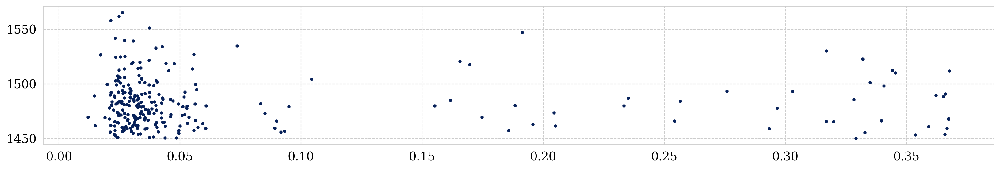

In [180]:
fig=plt.figure(figsize=(20,3))
plt.scatter(features_cleaned['imf_entropy_5'],features_cleaned['AvgSpeed'])

In [ ]:

def plot_pairplot(df,f):
    norm = plt.Normalize(df.Index.min(), df.Index.max())
    sm = plt.cm.ScalarMappable(cmap=sns.cubehelix_palette(df['Index'].max(), start=.5, rot=-.75,as_cmap=True), norm=norm)
    sm.set_array([])

    ax=sns.pairplot(df,vars=f, 
              hue='Index',
              palette=sns.cubehelix_palette(df['Index'].max(), start=.5, rot=-.75),
              diag_kind=None,plot_kws={"s": 50})

    ax._legend.remove()

    # ax.set_ylabel('WT04: Pairplot for features')
    # cbar=ax.fig.colorbar(sm)




    m0=int(np.floor(df.Index.min()))            # colorbar min value
    m4=int(np.ceil(df.Index.max()))             # colorbar max value
    m1=int(1*(m4-m0)/4.0 + m0)               # colorbar mid value 1
    m2=int(2*(m4-m0)/4.0 + m0)               # colorbar mid value 2
    m3=int(3*(m4-m0)/4.0 + m0)               # colorbar mid value 3


    ax.fig.suptitle(f'WT0{wt_num}: Pairplot for features',y=0.99)


    # use this colorbar

    plt.subplots_adjust(top=0.94)
    cbar = plt.colorbar(sm, ax=ax.axes)
    cbar.set_ticks([m0,m1,m2,m3,m4])
    cbar.set_ticklabels([m0,m1,m2,m3,m4])
    #plt.savefig(f'/content/gdrive/My Drive/colab_images/wt0{wt_num}_pairplot')
    plt.show()
    
plot_pairplot(features_cleaned,['AvgPower','imf_rate_5', 'imf_kurtosis_5'])


### Plotting features one by one

In [ ]:
# PLOT EACH COLUMN HERE:
def save_feature_figs(feature):
    for feat in features_cleaned.columns:
        
        if (len(feat.split('_'))>2):
            feat_name=(str(feat.split('_')[0])+ '\_' + str(feat.split('_')[1])+ '\_' + str(feat.split('_')[2]))
        elif (len(feat.split('_'))>1):
            feat_name=(str(feat.split('_')[0])+ '\_' + str(feat.split('_')[1]))
        else:
            feat_name=feat
        ax = features_cleaned[feat].plot(style='.-',title="WT04:\n Feature: " + r"$\bf{"+str(feat_name)+"}$",figsize=(15,3))
        ax.set_xlabel('Interval index (Time)')
        ax.set_ylabel('Feature value')
        
        plt.xlim(0,features_cleaned.shape[0])
        save_path=f'../../plots/features/{feature}'
        if (not os.path.exists(save_path)):
            try:
                os.mkdir(save_path)
            
            except OSError:
                print("Not able to create folder")

        # path exists now
        plt.tight_layout()
        plt.savefig(f'{save_path}/{feat}_and_{feature}.png',dpi=300)
        plt.show()

save_feature_figs('wt04_features_plotted_time')

Grouping `features_removed` by month and plotting  each feature to look for patterns

In [121]:
try:
    dt_times=df_times.drop(['Unnamed: 0'],axis=1)
except:
    print('Not removed')
    dt_times = df_times

In [29]:
formatted_dates = []

for d in dt_times['Date']:
    # df_times.append((d.split(' ')[0][:7]))
    formatted_dates.append((d.split(' ')[0][:7]))
    
new_times_df= pd.DataFrame(formatted_dates,columns=['Date'])
new_times_df['Index'] = new_times_df.index
# new_times_df=new_times_df.drop([0],axis=1) # removing a weird column

new_times_df['Index'] = new_times_df.index

Adding the month column to the features cleaned df and plotting the boxplots.

Note here that the features are cleaned!!

In [ ]:
features_cleaned.drop(['Date'],axis=1,inplace=True)

In [ ]:
features_cleaned.columns

In [123]:
wt_num

3

In [157]:
features_cleaned.to_csv(f'dataset_wt_{wt_num}.csv')

In [138]:
result['imf_kurtosis_4'].max()

4.30795501472768

In [125]:
wtnum=3

[25, 25, 24, 23, 22, 21, 19, 16, 16, 15, 15, 11, 10, 9, 9]


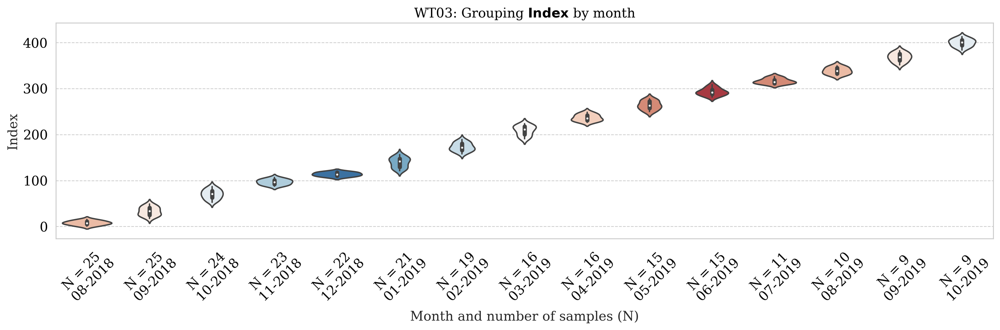

[25, 25, 24, 23, 22, 21, 19, 16, 16, 15, 15, 11, 10, 9, 9]


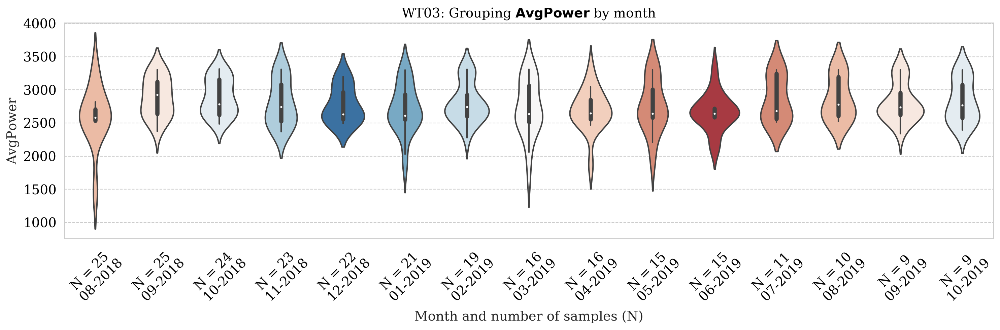

[25, 25, 24, 23, 22, 21, 19, 16, 16, 15, 15, 11, 10, 9, 9]


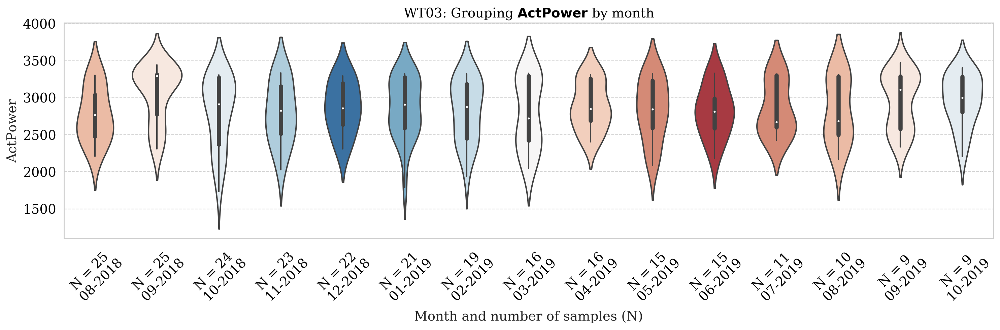

[25, 25, 24, 23, 22, 21, 19, 16, 16, 15, 15, 11, 10, 9, 9]


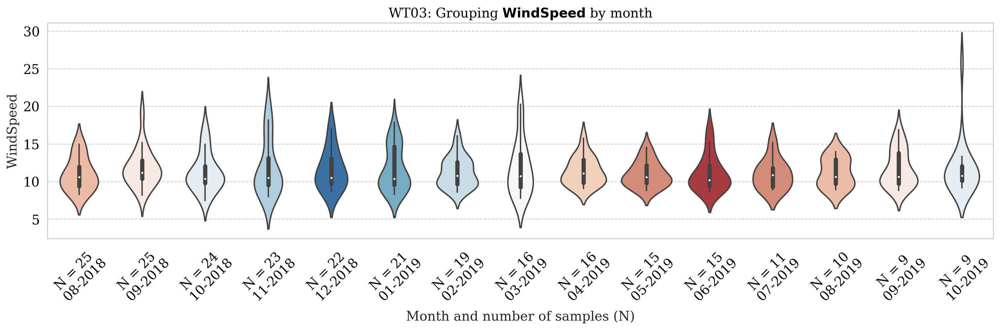

[25, 25, 24, 23, 22, 21, 19, 16, 16, 15, 15, 11, 10, 9, 9]


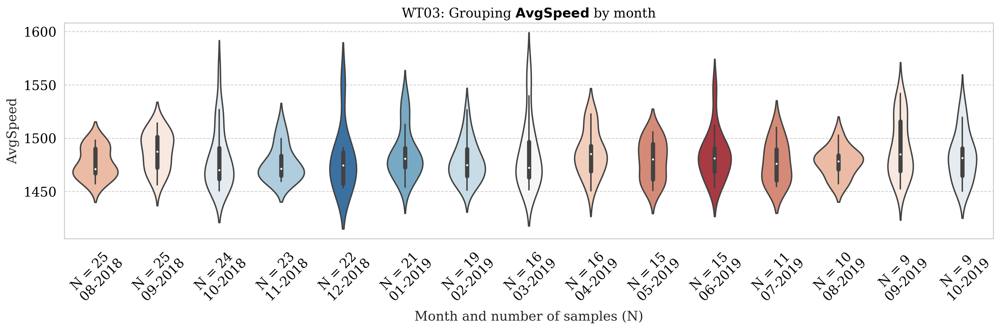

[25, 25, 24, 23, 22, 21, 19, 16, 16, 15, 15, 11, 10, 9, 9]


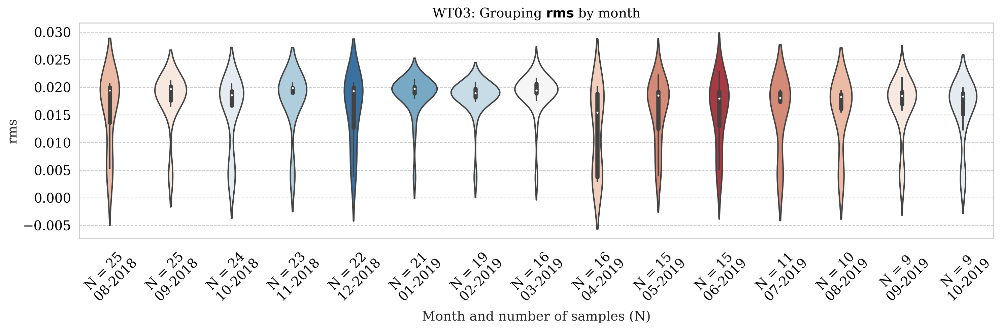

[25, 25, 24, 23, 22, 21, 19, 16, 16, 15, 15, 11, 10, 9, 9]


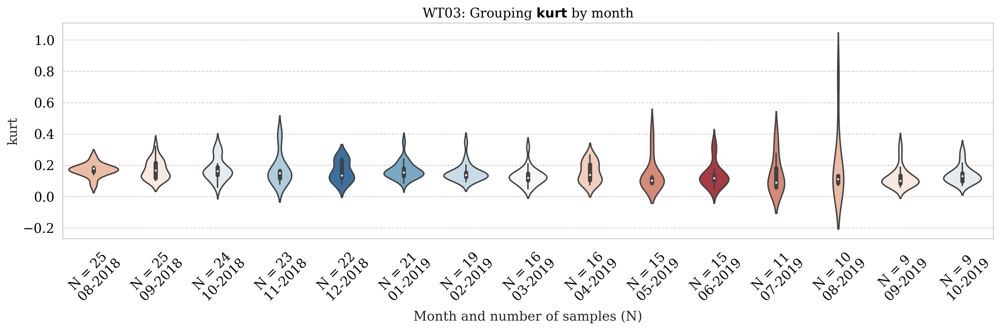

[25, 25, 24, 23, 22, 21, 19, 16, 16, 15, 15, 11, 10, 9, 9]


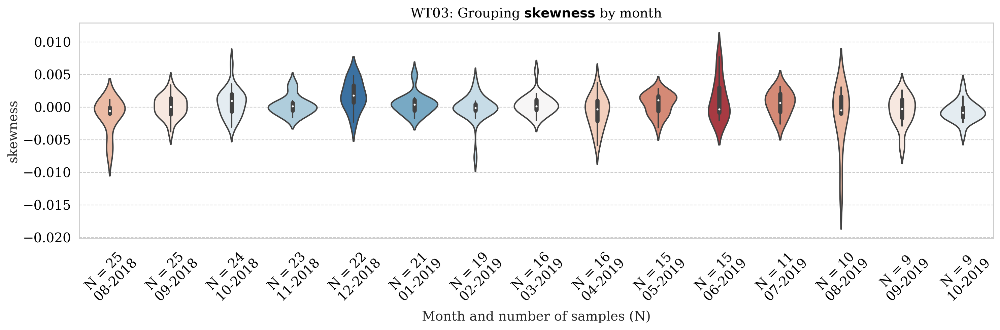

[25, 25, 24, 23, 22, 21, 19, 16, 16, 15, 15, 11, 10, 9, 9]


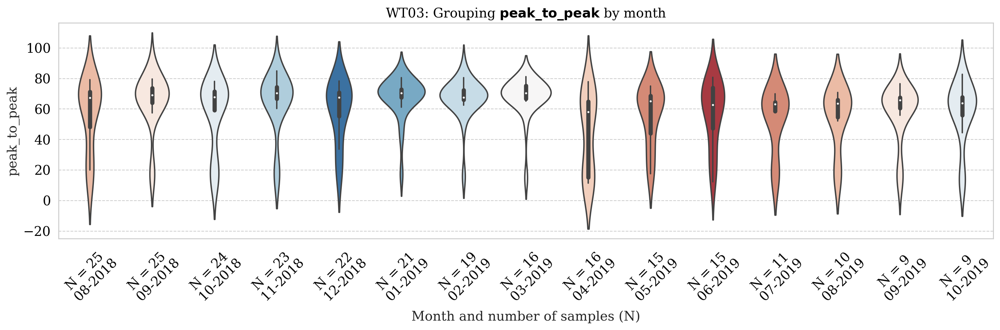

[25, 25, 24, 23, 22, 21, 19, 16, 16, 15, 15, 11, 10, 9, 9]


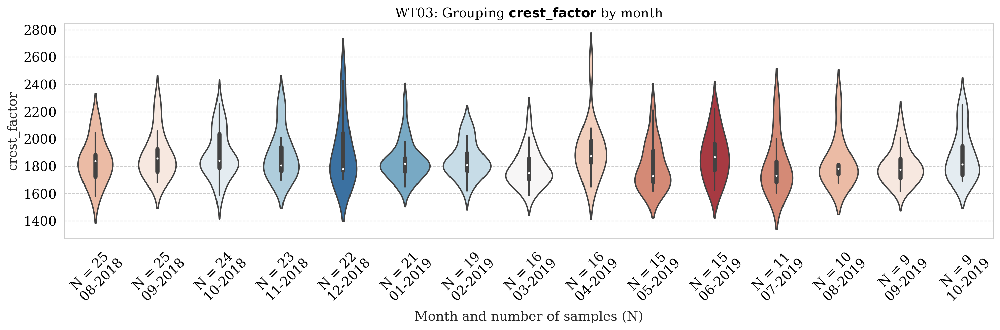

[25, 25, 24, 23, 22, 21, 19, 16, 16, 15, 15, 11, 10, 9, 9]


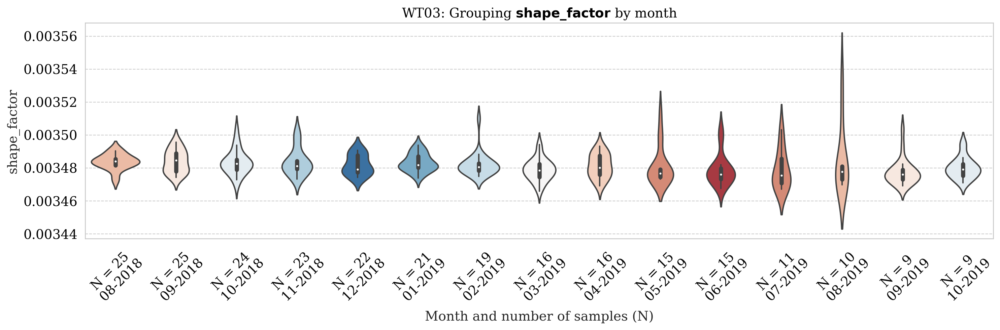

[25, 25, 24, 23, 22, 21, 19, 16, 16, 15, 15, 11, 10, 9, 9]


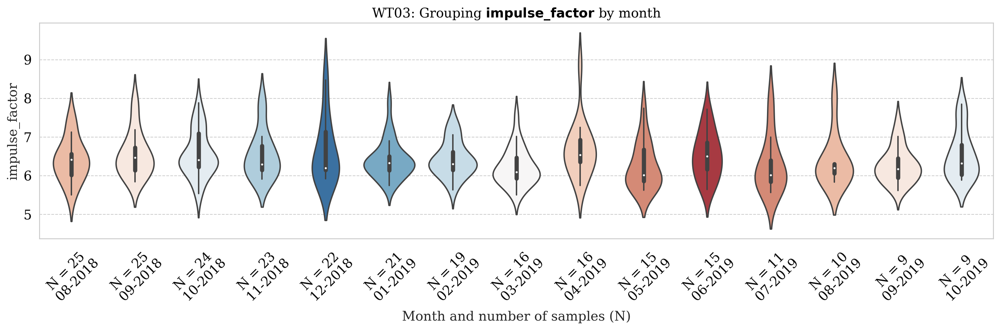

[25, 25, 24, 23, 22, 21, 19, 16, 16, 15, 15, 11, 10, 9, 9]


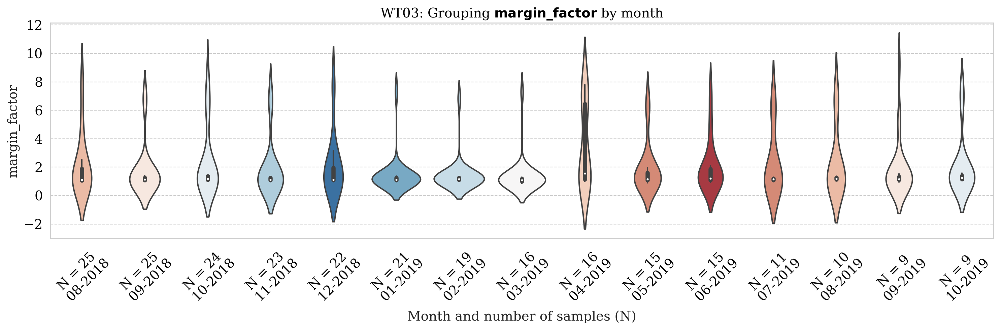

[25, 25, 24, 23, 22, 21, 19, 16, 16, 15, 15, 11, 10, 9, 9]


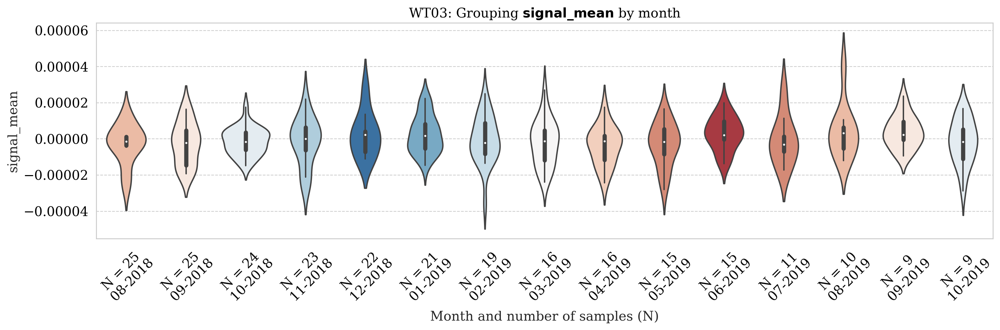

[25, 25, 24, 23, 22, 21, 19, 16, 16, 15, 15, 11, 10, 9, 9]


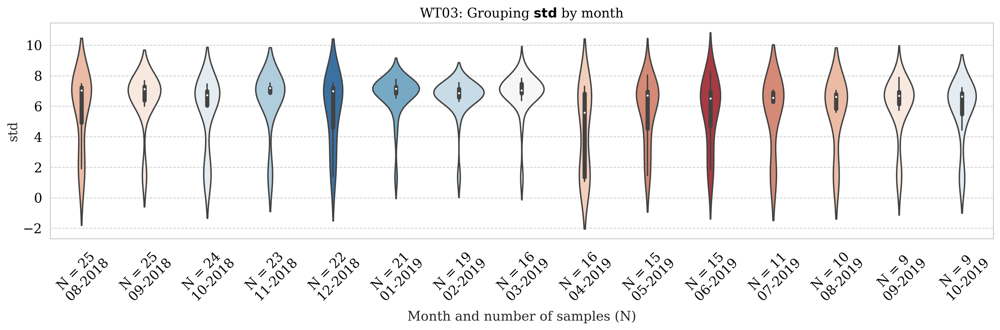

[25, 25, 24, 23, 22, 21, 19, 16, 16, 15, 15, 11, 10, 9, 9]


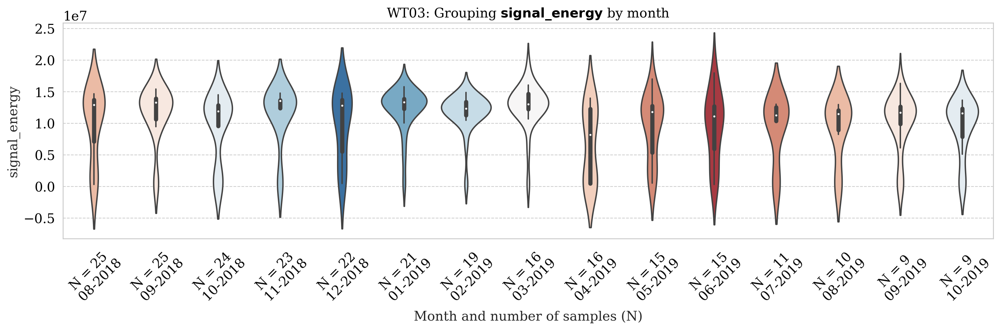

[25, 25, 24, 23, 22, 21, 19, 16, 16, 15, 15, 11, 10, 9, 9]


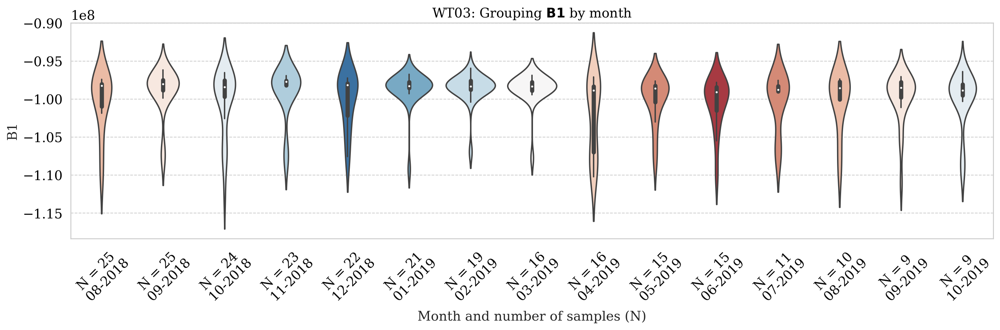

[25, 25, 24, 23, 22, 21, 19, 16, 16, 15, 15, 11, 10, 9, 9]


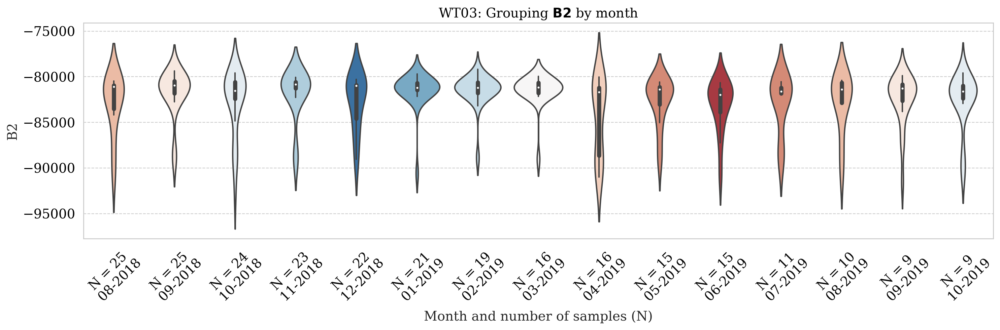

[25, 25, 24, 23, 22, 21, 19, 16, 16, 15, 15, 11, 10, 9, 9]


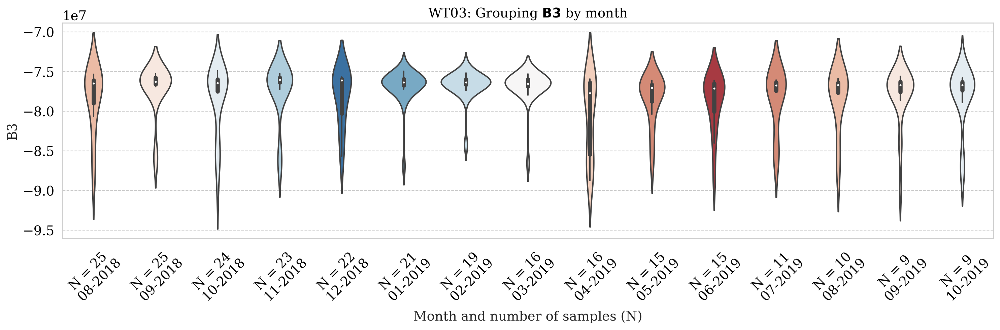

[25, 25, 24, 23, 22, 21, 19, 16, 16, 15, 15, 11, 10, 9, 9]


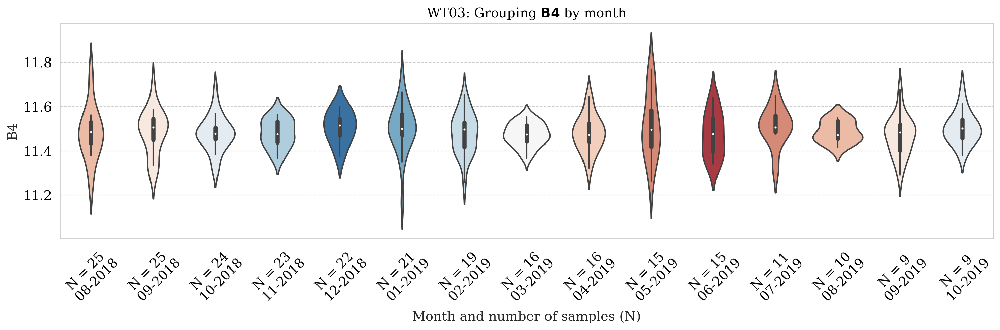

[25, 25, 24, 23, 22, 21, 19, 16, 16, 15, 15, 11, 10, 9, 9]


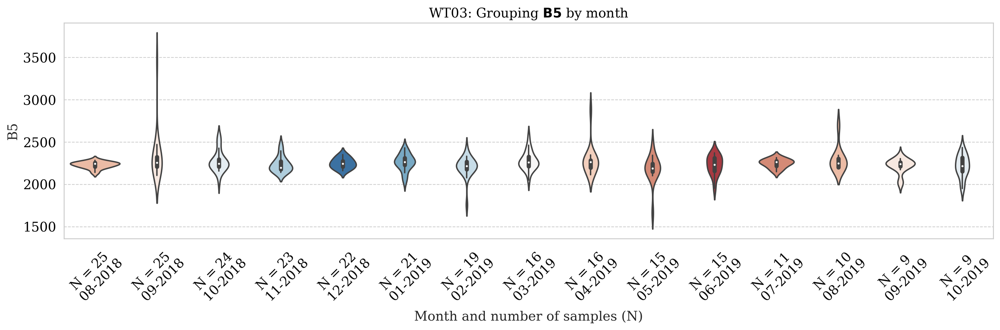

[25, 25, 24, 23, 22, 21, 19, 16, 16, 15, 15, 11, 10, 9, 9]


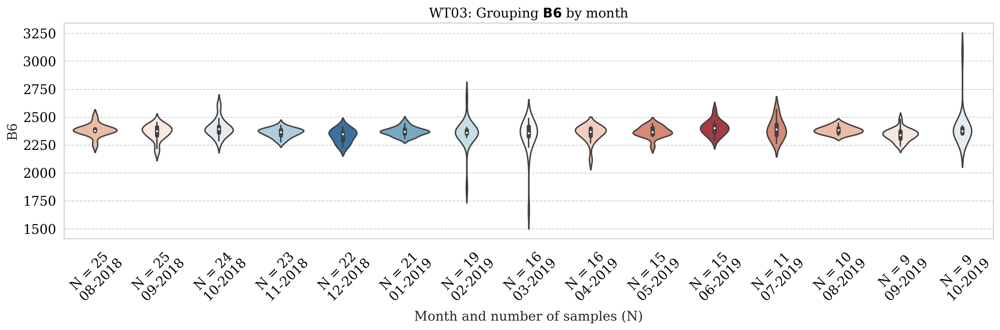

[25, 25, 24, 23, 22, 21, 19, 16, 16, 15, 15, 11, 10, 9, 9]


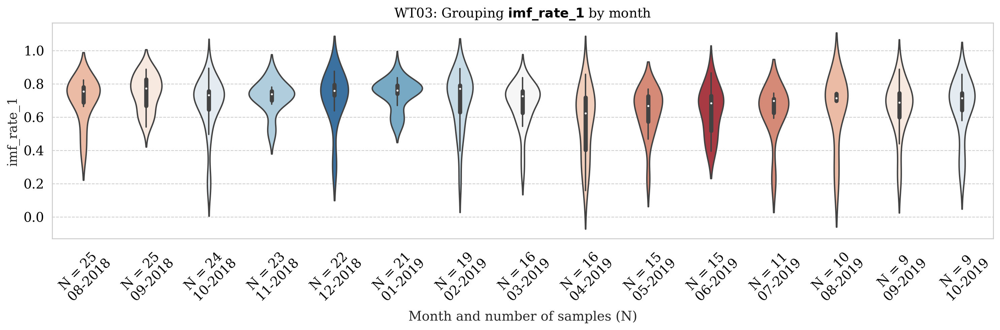

[25, 25, 24, 23, 22, 21, 19, 16, 16, 15, 15, 11, 10, 9, 9]


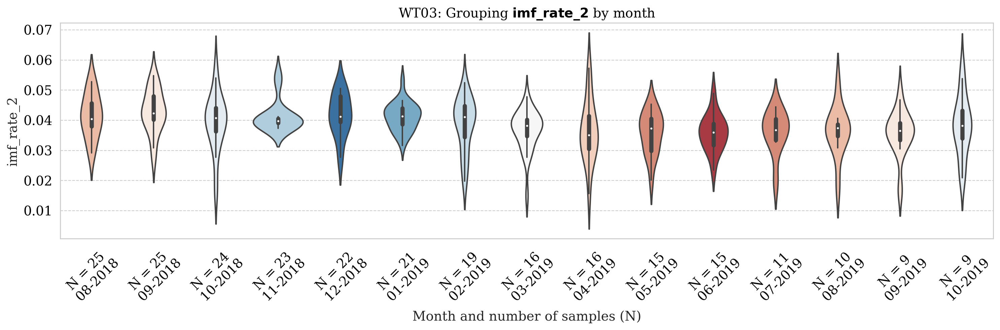

[25, 25, 24, 23, 22, 21, 19, 16, 16, 15, 15, 11, 10, 9, 9]


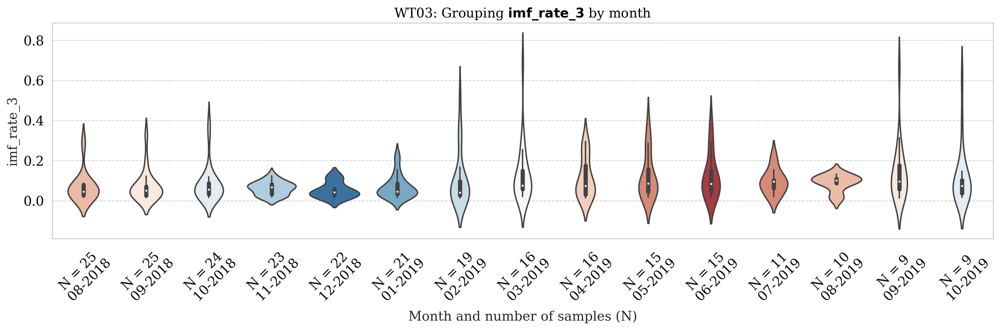

[25, 25, 24, 23, 22, 21, 19, 16, 16, 15, 15, 11, 10, 9, 9]


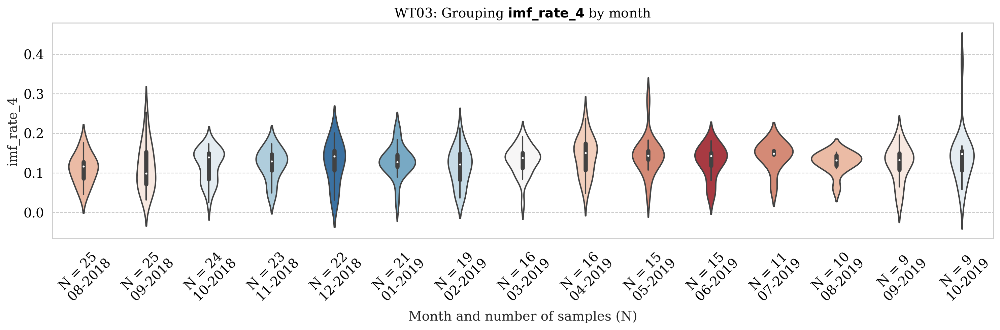

[25, 25, 24, 23, 22, 21, 19, 16, 16, 15, 15, 11, 10, 9, 9]


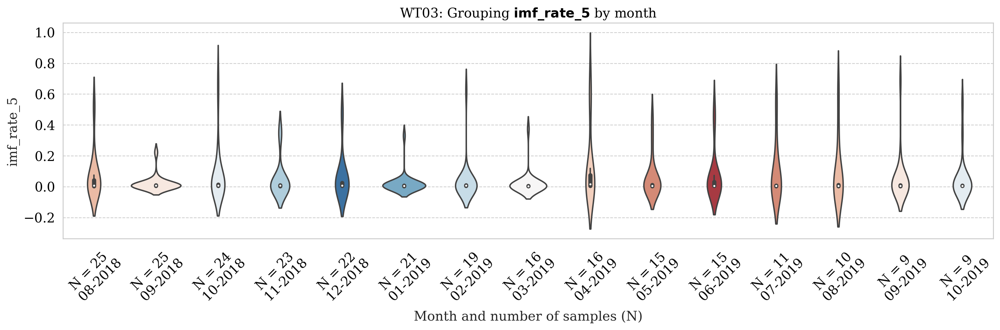

[25, 25, 24, 23, 22, 21, 19, 16, 16, 15, 15, 11, 10, 9, 9]


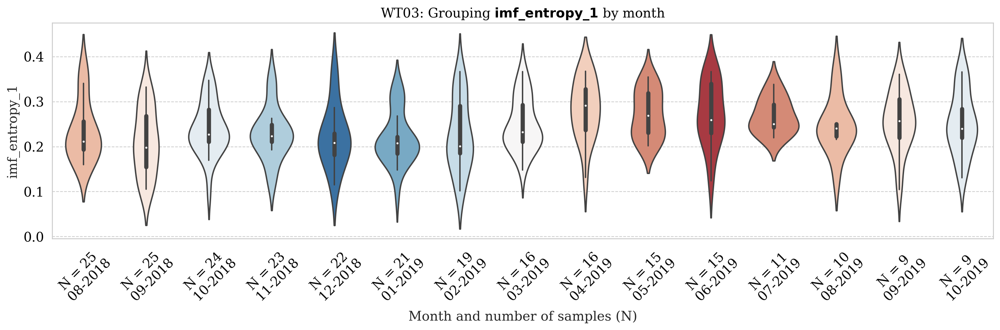

[25, 25, 24, 23, 22, 21, 19, 16, 16, 15, 15, 11, 10, 9, 9]


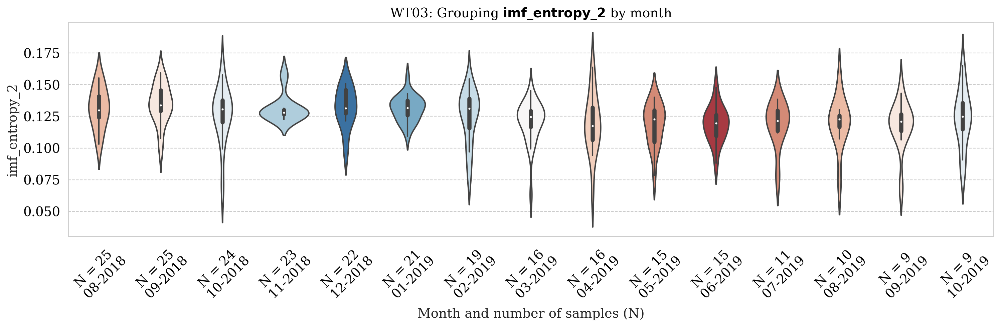

[25, 25, 24, 23, 22, 21, 19, 16, 16, 15, 15, 11, 10, 9, 9]


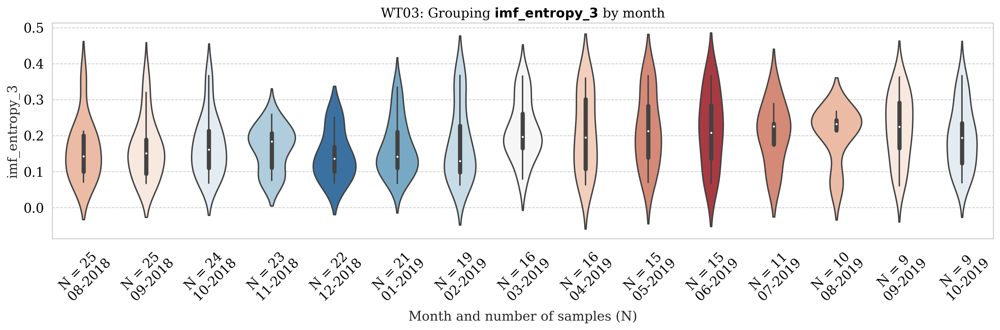

[25, 25, 24, 23, 22, 21, 19, 16, 16, 15, 15, 11, 10, 9, 9]


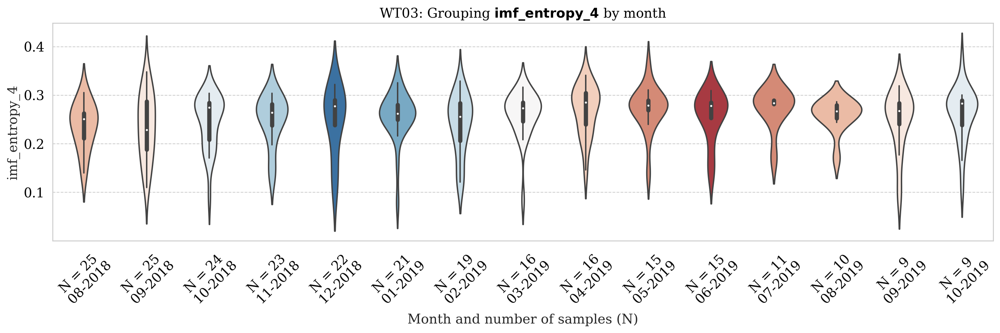

[25, 25, 24, 23, 22, 21, 19, 16, 16, 15, 15, 11, 10, 9, 9]


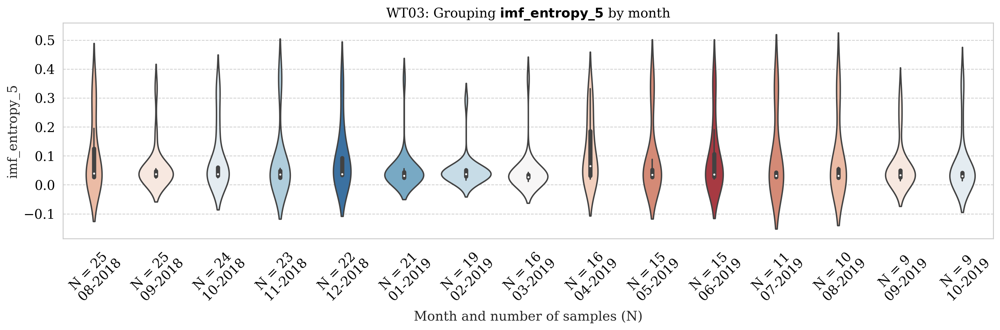

[25, 25, 24, 23, 22, 21, 19, 16, 16, 15, 15, 11, 10, 9, 9]


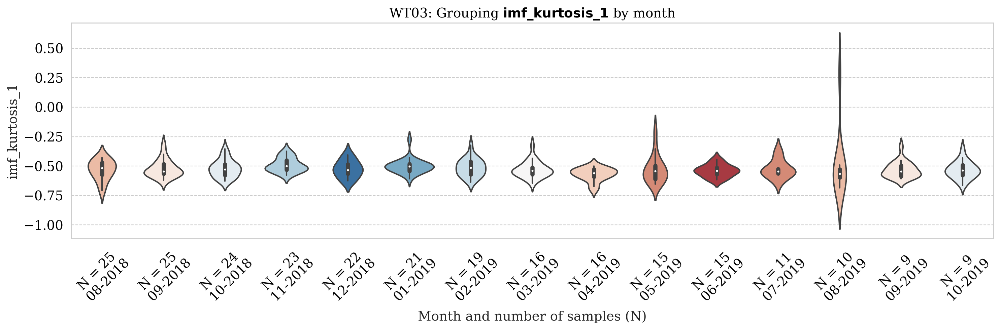

[25, 25, 24, 23, 22, 21, 19, 16, 16, 15, 15, 11, 10, 9, 9]


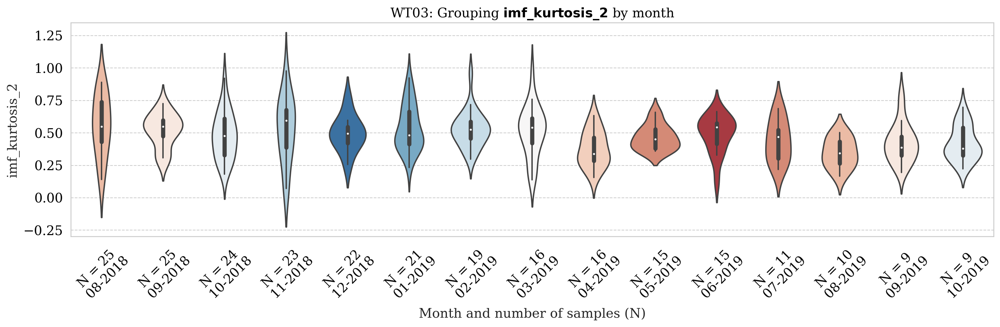

[25, 25, 24, 23, 22, 21, 19, 16, 16, 15, 15, 11, 10, 9, 9]


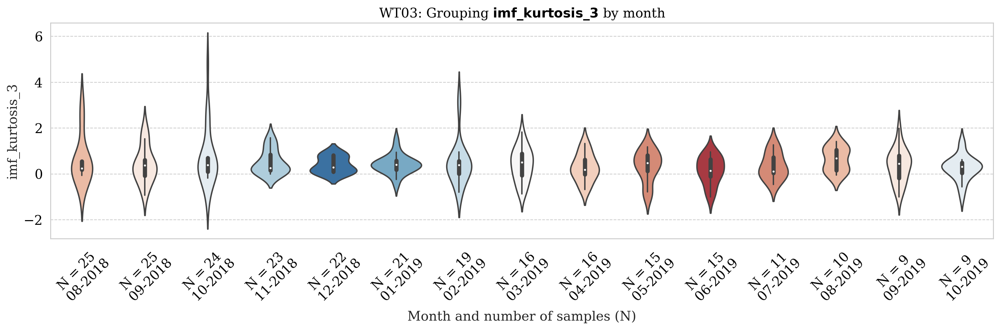

[25, 25, 24, 23, 22, 21, 19, 16, 16, 15, 15, 11, 10, 9, 9]


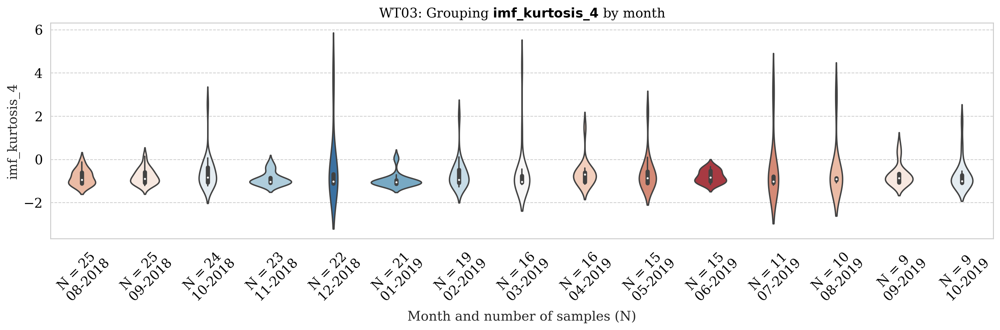

[25, 25, 24, 23, 22, 21, 19, 16, 16, 15, 15, 11, 10, 9, 9]


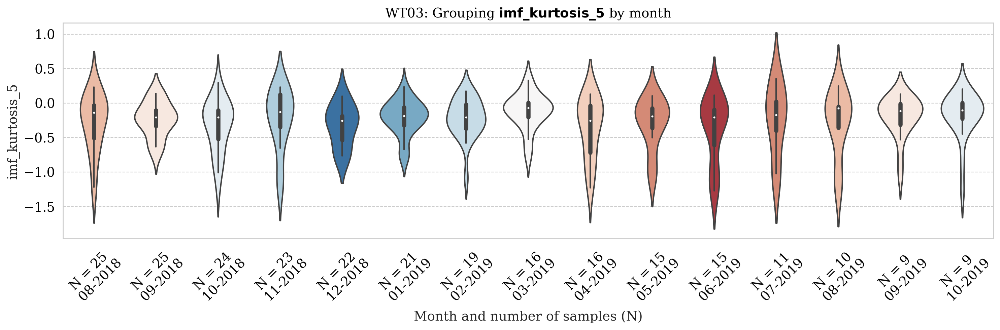

In [128]:
result = pd.merge(features_cleaned,
                  new_times_df,
                  left_on='Index',
                  right_on='Index',
                  how='left')


date_old_format=(result['Date']).values



# print(date_old_format)

import datetime
def reformat_date(date):    
    my_date = datetime.datetime.strptime(date, "%Y-%m")
    return (my_date.strftime("%m-%Y"))

result['Date']=[reformat_date(d) for d in date_old_format]

# Now, plot it: 

features_to_plot = ['Index', 'AvgPower', 'ActPower', 'WindSpeed', 'AvgSpeed', 'rms', 'kurt',
       'skewness', 'peak_to_peak', 'crest_factor', 'shape_factor',
       'impulse_factor', 'margin_factor', 'signal_mean', 'std',
       'signal_energy', 'B1', 'B2', 'B3', 'B4', 'B5', 'B6', 'imf_rate_1',
       'imf_rate_2', 'imf_rate_3', 'imf_rate_4', 'imf_rate_5', 'imf_entropy_1',
       'imf_entropy_2', 'imf_entropy_3', 'imf_entropy_4', 'imf_entropy_5',
       'imf_kurtosis_1', 'imf_kurtosis_2', 'imf_kurtosis_3', 'imf_kurtosis_4',
       'imf_kurtosis_5']

plot_season_groups(result,features_to_plot,wtnum)

# Correlation plot

In [ ]:
features_cleaned.columns

Is this created on the raw features_cleaned?

Is this created on the raw features_cleaned

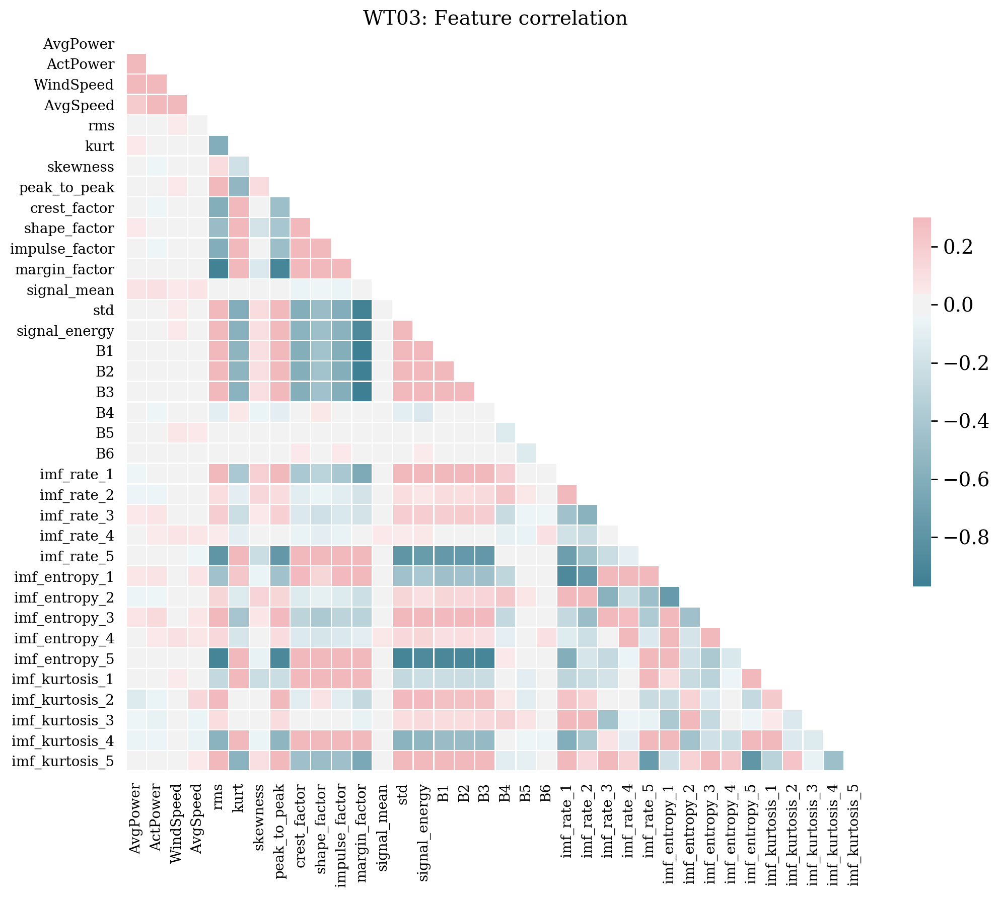

In [139]:
features_cleaned_corr = features_cleaned.drop(['Index'],axis=1)
correlation_plot.create_save_correlation_plot(f'wt0{wt_num}_features',f'WT0{wt_num}: Feature correlation',features_cleaned_corr)

# Clustering

The function below, ```calculate_cluster_stats```, is used to calculate statistics from each cluster. In particular, we are here looking for clusters that consist of higher indexes, i.e. vibration intervals taken at a later point in time. These later intervals are more likely to have fault characteristics visible.

In [140]:
def calculate_cluster_stats(clusterDict):
    '''
        Args:
            clusterDict (Dictionary):
                keys (Integer): cluster index
                values (List): List containing index of intevals
        Returns:
            df_stats (pd.DataFrame): DataFrame containing stats about the cluster input.
    '''
    df=[]
    means=[]
    num_intervals=[]
    num_intervals_greater_than_350=[]
    percentage_greater_than_350=[]
    for i in range(len(clusterDict)):
        mean=np.mean(clusterDict[i])
        num_interval=len(clusterDict[i])
        num_interval_greater_than_350=len(list(filter(lambda index: index > 350, clusterDict[i])))
        percentage=round((num_interval_greater_than_350/num_interval)*100)

        means.append(mean)
        num_intervals.append(num_interval)
        num_intervals_greater_than_350.append(num_interval_greater_than_350)
        percentage_greater_than_350.append(percentage)


    df.append(num_intervals)
    df.append(means)
    df.append(num_intervals_greater_than_350)
    df.append(percentage_greater_than_350)
    df=np.asarray(df)


    df_stats = pd.DataFrame(data=df.T,columns=['number_of_intervals_in_cluster','avg_index','number_of_indexes_greater_than_350','percentage_intervals_greater_than_350'])
    return df_stats

**Anomaly** detecion is performed using three approaches:
 - **[1]** Some stats on the df
 - **[3]** KMeans clustering


In [141]:
wt_num = 3

,Index
195,303
196,304
197,309
198,310
199,311
...,...
255,407
256,409
257,411
258,412


Some initial stats on the data, after all cleaning:
########################################
    - There are 43 signals over index 350
    - There are 217 signals below index 350
    - There are 21 signals between 300 and 350
########################################
LOCS: [-100.    0.  100.  200.  300.  400.  500.]
labels 
['\n2019-07-14', '0\n2018-08-04', '100\n2018-11-11', '200\n2019-03-06', '300\n2019-06-21', '400\n2019-10-17', '']


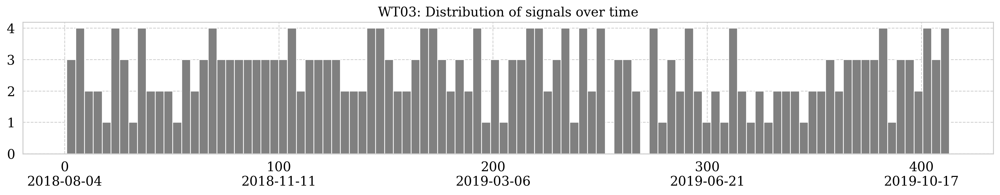

In [142]:
signals_over_index_350=(features_cleaned['Index'][features_cleaned['Index']>350]).shape

signals_0_to_100 = pd.DataFrame(data=features_cleaned['Index'][features_cleaned['Index']>300],columns=['Index'])

signals_300_to_350 = pd.DataFrame(data=features_cleaned['Index'][features_cleaned['Index']>300],columns=['Index'])
display(signals_300_to_350)
signals_300_to_350 = (signals_300_to_350['Index'][signals_300_to_350['Index']<350]).shape

print('Some initial stats on the data, after all cleaning:')
print('########################################')
print(f'    - There are {signals_over_index_350[0]} signals over index 350')
print(f'    - There are {features_cleaned.shape[0]-signals_over_index_350[0]} signals below index 350')
print(f'    - There are {signals_300_to_350[0]} signals between 300 and 350')
print('########################################')

# plt.scatter(features_cleaned['Index'],features_cleaned.index,s=20,edgecolor='#072159',color='none')
# features_cleaned['Index'].plot.scatter(x='index',y='Index')

'''
fig, ax = plt.subplots(figsize=(15, 4))
                       
ax=sns.violinplot(features_cleaned['Index'],color='lightgrey',title='Distribution of signals over time',ax=ax)
ax.set_title('WT04: Distribution of signal indexes')
plt.xlim(-100,530)
plt.setp(ax.collections, alpha=.5)
plt.tight_layout()

locs = ax.get_xticks()

labels = [item.get_text() for item in ax.get_xticklabels()]
for i in range(1,6):
    labels[i] = labels[i] + '\n' + (str(df_times_unfiltered['Date'].iloc[int(locs[i])])).split(' ')[0]

ax.set_xticklabels(labels)
'''

plt.figure(figsize=(15,3))
axx=(features_cleaned['Index']).hist(color='grey',bins=100)
#plt.margins(0)

locs = axx.get_xticks()
print('LOCS:',locs)
labels = [item.get_text() for item in axx.get_xticklabels()]

labels = [str(int(x)) for x in locs]
#labels = ["%.2f" % x for x in locs]


labels[0]=''
labels[-1]='' 
# labels=['', '0', '100', '200', '300', '400', '']
print('labels',labels[0])
# labels=['0','100','200','300','400']
for i in range(len(locs)-1):
    labels[i] = labels[i] + '\n' + (str(df_times_unfiltered['Date'].iloc[int(locs[i])])).split(' ')[0]

print(labels)
    
axx.set_xticklabels(labels)

plt.title(f'WT0{wt_num}: Distribution of signals over time')
plt.tight_layout()


save_path=f'../../plots/cluster_results'
plt.savefig(f'{save_path}/wt_{wt_num}_signal_distribution.png',dpi=300)
plt.show()

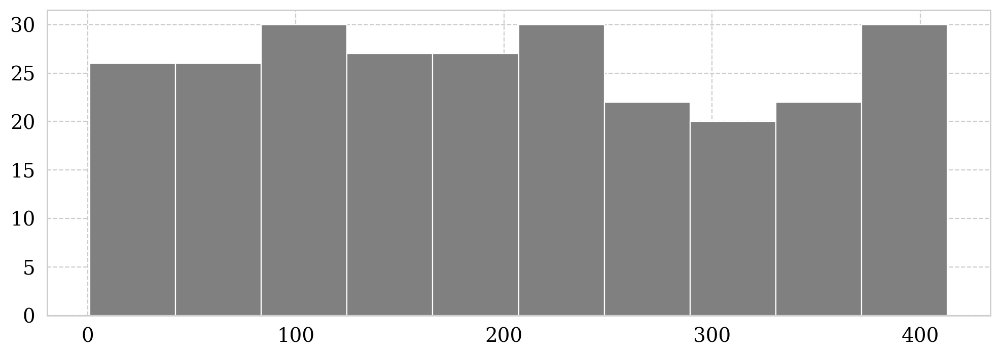

In [143]:
axx=(features_cleaned['Index']).hist(color='grey')

In [159]:
features_cleaned.columns

Index(['Index', 'AvgPower', 'ActPower', 'WindSpeed', 'AvgSpeed', 'rms', 'kurt',
       'skewness', 'peak_to_peak', 'crest_factor', 'shape_factor',
       'impulse_factor', 'margin_factor', 'signal_mean', 'std',
       'signal_energy', 'B1', 'B2', 'B3', 'B4', 'B5', 'B6', 'imf_rate_1',
       'imf_rate_2', 'imf_rate_3', 'imf_rate_4', 'imf_rate_5', 'imf_entropy_1',
       'imf_entropy_2', 'imf_entropy_3', 'imf_entropy_4', 'imf_entropy_5',
       'imf_kurtosis_1', 'imf_kurtosis_2', 'imf_kurtosis_3', 'imf_kurtosis_4',
       'imf_kurtosis_5'],
      dtype='object')

In [165]:
features_cleaned.describe()

,Index,AvgPower,ActPower,WindSpeed,AvgSpeed,rms,kurt,skewness,peak_to_peak,crest_factor,...,imf_entropy_1,imf_entropy_2,imf_entropy_3,imf_entropy_4,imf_entropy_5,imf_kurtosis_1,imf_kurtosis_2,imf_kurtosis_3,imf_kurtosis_4,imf_kurtosis_5
count,260.000000,260.000000,260.000000,260.000000,260.000000,260.000000,260.000000,260.000000,260.000000,260.000000,...,260.000000,260.000000,260.000000,260.000000,260.000000,260.000000,260.000000,260.000000,260.000000,260.000000
mean,202.446154,2779.729515,2863.786932,11.487692,1482.997816,0.016573,0.154751,0.000081,60.298192,1849.970399,...,0.244083,0.124650,0.190295,0.253509,0.075539,-0.524034,0.480317,0.422515,-0.696790,-0.248393
std,119.542601,336.387311,400.120112,2.656965,22.988186,0.005554,0.080840,0.002251,19.675573,165.284056,...,0.066032,0.018549,0.088698,0.053834,0.097140,0.088686,0.169585,0.757092,0.760205,0.356329
min,1.000000,1464.688110,1734.500000,7.500000,1450.419485,0.002653,0.046945,-0.012748,10.578601,1580.092946,...,0.094261,0.063105,0.059691,0.079288,0.011967,-0.707980,0.071866,-1.066699,-1.259859,-1.287822
25%,100.750000,2568.128784,2542.474976,9.600000,1465.572581,0.017096,0.105273,-0.000956,60.531539,1735.252447,...,0.202991,0.118210,0.112399,0.233199,0.027017,-0.575256,0.360898,0.043937,-1.078048,-0.363553
50%,193.500000,2713.354126,2892.200073,10.700000,1479.851522,0.018887,0.135851,0.000016,67.042685,1808.749272,...,0.234459,0.126647,0.185366,0.269093,0.034195,-0.534361,0.474712,0.352751,-0.946442,-0.156408
75%,300.000000,3023.945374,3290.750061,12.625000,1492.931888,0.019791,0.176662,0.001287,71.629922,1934.649541,...,0.292459,0.135185,0.245110,0.286864,0.052177,-0.489051,0.592414,0.722022,-0.613280,-0.012005
max,413.000000,3315.529297,3469.699951,25.900000,1565.586288,0.023507,0.770732,0.007747,89.601366,2540.218012,...,0.367877,0.165153,0.367865,0.367633,0.367796,0.283871,0.979110,4.827467,4.307955,0.354468


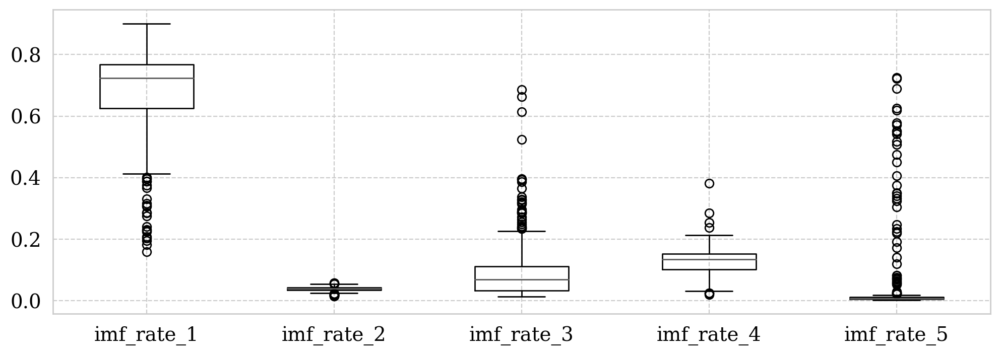

In [161]:
features_cleaned[['imf_rate_1','imf_rate_2', 'imf_rate_3', 'imf_rate_4', 'imf_rate_5']].boxplot()

## K-means raw (features_cleaned)
First, count the number of points after 350:


In [144]:
def kmeans(dataset_name,wt_num,SELECTED_FEATURES,max_cluster_num,print_latex=False,plottitle=''):

    '''INITIAL ELBOW METHOD:'''
    # plotting an additional plot which is not needed here
    cluster_labels = clustering.k_means_clustering(plottitle,wt_num,SELECTED_FEATURES,'kmeans', knn_clusters=max_cluster_num,plot=False,dataset_name=dataset_name)
    
    # finding the max clusters based on values
    # Use calculate_cluster_stats to optimize.
    final_array=[]
    final_df = []
    max_cluster_number=[]
    intervals_in_max_cluster=[]
    max_percentages=[]
    intervals_greater_than_350=[]
    number_of_clusters=[]
    for i in tqdm(range(2,max_cluster_num+1)):
        cluster_labels = clustering.k_means_clustering(plottitle,wt_num,SELECTED_FEATURES,'kmeans',knn_clusters=i,plot=False) # Cluster the points
        clusterDict=clustering.plot_clusters(plottitle,wt_num,i,cluster_labels,SELECTED_FEATURES,plot=False) # plot the clusters
        cluster_df=calculate_cluster_stats(clusterDict)
        display(cluster_df)

        # Do some more work here... Add them to an array and build a dataframe
        max_percentage=(cluster_df['percentage_intervals_greater_than_350'].max())
        temp=cluster_df[cluster_df['percentage_intervals_greater_than_350']==max_percentage]
        interval_in_cluster = (temp['number_of_intervals_in_cluster'].max())
        
        get_cluster = temp[temp['number_of_intervals_in_cluster']==interval_in_cluster]
        intervals_in_cluster_above_350 = get_cluster['number_of_indexes_greater_than_350']
                
        max_cluster_number.append(i)
        intervals_in_max_cluster.append(interval_in_cluster) # number of intervals in the max cluster (the cluster with most of the interesting points)
        intervals_greater_than_350.append(intervals_in_cluster_above_350.values[0]) # number of intervals greater tha 350
        max_percentages.append(max_percentage)

    # Appending to array        
    final_df.append(max_cluster_number)
    final_df.append(intervals_in_max_cluster)
    final_df.append(intervals_greater_than_350)
    final_df.append(max_percentages)

    final_df=np.asarray(final_df)

    final_df=pd.DataFrame(final_df.T,columns=['max_cluster_number','intervals_in_max_cluster','intervals_greater_than_350','max_percentages'])
    
    # Converting final_df columns to ints, except from the percentage column.
    for feat in final_df.columns:
        if feat != 'max_percentages':
            final_df[feat]=final_df[feat].apply(lambda x: int(x))
        else:
            continue
    
    #final_df.style.set_precision(0)
    text=(df_to_latex(final_df,False))
    if print_latex == True:
        print(text)
    #display(final_df)

    return final_df

 `run_kmeans` and select K based on the results of the next cell

In [145]:
# Run K-means with the selected K and df.
def run_kmeans(plottitle,wt_num, dataset_name, data_set,k,selected_cluster=None,**features_to_pairplot):
    '''
    INPUTS:
        - data_set (Pandas Dataframe): The feature dataset.
    OUTPUTS:
        - cluster_df (Pandas DataFrame): Df containing clusters and samples.
    '''
    SELECTED_FEATURES=data_set
    max_cluster_num = k
    
    '''
    df = kmeans(wt_num_string,SELECTED_FEATURES,max_cluster_num,dataset_name)

    #plt.scatter(df.max_cluster_number,df.max_percentages)
    #plt.show()

    display(df)
    '''
    SELECTED_CLUSTER_NUMBER = k # need to optimize this value

    # now plot this:
    
    # plotting elbow. 
    cluster_labels = clustering.k_means_clustering(plottitle,wt_num,SELECTED_FEATURES,'kmeans',knn_clusters=SELECTED_CLUSTER_NUMBER,plot=True,dataset_name=dataset_name,selected_cluster=selected_cluster)

    # plotting cluster development and index distribution
    clusterDict=clustering.plot_clusters(plottitle,wt_num,k,cluster_labels,SELECTED_FEATURES,plot=True,dataset_name=dataset_name) # plot the clusters

    # display(calculate_cluster_stats(clusterDict))
    
    j=0
    if features_to_pairplot:
        for key, value in features_to_pairplot.items():
            dataset_name_= dataset_name + f'_{j}_'    
            clustering.plot_clusters_pair_plot(selected_cluster,plottitle,wt_num,k,'kmeans',SELECTED_FEATURES, value,cluster_labels,dataset_name=dataset_name_) # pair plot 1
            '''
            else:
                print('len is less or equal to 2')
                clustering.scatter_plot(selected_cluster,plottitle,wt_num,k,'kmeans',SELECTED_FEATURES, value,cluster_labels,dataset_name=dataset_name_) # pair plot 1
            ''' 
            j+=1
    else:
        dataset_name1=dataset_name+'_1_'
        clustering.plot_clusters_pair_plot(selected_cluster,plottitle,wt_num,k,'kmeans',SELECTED_FEATURES, ['AvgSpeed','rms','B4'],cluster_labels,dataset_name=dataset_name1) # pair plot 1
        dataset_name2=dataset_name+'_2_'
        clustering.plot_clusters_pair_plot(selected_cluster,plottitle,wt_num,k,'kmeans',SELECTED_FEATURES, ['AvgPower','AvgSpeed','imf_entropy_4', 'imf_entropy_5','B4'],cluster_labels, dataset_name=dataset_name2) # pair plot 2
        cluster_df=calculate_cluster_stats(clusterDict)
        cluster_df
        
    return cluster_labels


# Some other feature sets

In [146]:
# Different subsets:
operating_features=features_cleaned[['Index', 'AvgPower', 'ActPower', 'WindSpeed', 'AvgSpeed']]

# Frequency-domain
bispectrum_features=features_cleaned[['B1', 'B2', 'B3', 'B4', 'B5', 'B6']]
#bispectrum_features['Index'] = features_cleaned['Index']

# Frequency-domain
time_features=features_cleaned[['rms', 'kurt',
       'skewness', 'peak_to_peak', 'crest_factor', 'shape_factor',
       'impulse_factor', 'margin_factor', 'signal_mean', 'std',
       'signal_energy']]

# Time-frequency features (EEMD; IMFs)
imf_features=features_cleaned[['imf_rate_1',
       'imf_rate_2', 'imf_rate_3', 'imf_rate_4', 'imf_rate_5', 'imf_entropy_1',
       'imf_entropy_2', 'imf_entropy_3', 'imf_entropy_4', 'imf_entropy_5']]

# IMF kurtosis features
imf_kurt_features=features_cleaned[['imf_kurtosis_1','imf_kurtosis_2','imf_kurtosis_3','imf_kurtosis_4','imf_kurtosis_5']]

In [69]:
features_cleaned.columns

Index(['Index', 'AvgPower', 'ActPower', 'WindSpeed', 'AvgSpeed', 'rms', 'kurt',
       'skewness', 'peak_to_peak', 'crest_factor', 'shape_factor',
       'impulse_factor', 'margin_factor', 'signal_mean', 'std',
       'signal_energy', 'B1', 'B2', 'B3', 'B4', 'B5', 'B6', 'imf_rate_1',
       'imf_rate_2', 'imf_rate_3', 'imf_rate_4', 'imf_rate_5', 'imf_entropy_1',
       'imf_entropy_2', 'imf_entropy_3', 'imf_entropy_4', 'imf_entropy_5',
       'imf_kurtosis_1', 'imf_kurtosis_2', 'imf_kurtosis_3', 'imf_kurtosis_4',
       'imf_kurtosis_5'],
      dtype='object')

In [147]:
op_and_bispec_features = pd.concat([operating_features,bispectrum_features],axis=1)
op_and_time_features = pd.concat([operating_features,time_features],axis=1)
op_and_imf_kurtosis_features = pd.concat([operating_features,imf_kurt_features],axis=1)
op_and_imf_features = pd.concat([operating_features,imf_features],axis=1)

feature_mix=features_cleaned[['Index', 'AvgPower','WindSpeed', 'AvgSpeed','imf_rate_5','imf_kurtosis_5','B1','B5']]

features_sets= [
                op_and_bispec_features,
                op_and_time_features,
                op_and_imf_kurtosis_features,
                op_and_imf_features,
                feature_mix    
               ]

features_sets_names= [
                'op_and_bispec_features',
                'op_and_time_features',
                'op_and_imf_kurtosis_features',
                'op_and_imf_features',
                'feature_mix'
               ]

### Running through the different subsets of dataframes with kmeans

In [ ]:
import matplotlib
# this method is just for plotting the different final_dfs (the dfs comaring the K values.)

def plot_k_means_tuning(wt_num,df,feature_set_name):
    colormap = plt.cm.Blues
    normalize = matplotlib.colors.Normalize(vmin=-20, vmax=30)
    
    fig,ax=plt.subplots(figsize=(15,5))
    # df.plot.scatter(x='intervals_in_max_cluster',y='max_percentages',c='max_cluster_number',cmap='Blues',s=50,ax=ax)
    
    df.plot.scatter(x='intervals_in_max_cluster',y='max_cluster_number',c='max_percentages',cmap='Blues',s=50,ax=ax)

    # plt.scatter(df.intervals_in_max_cluster,df.max_cluster_number,s=100,c=df.max_percentages,cmap='Blues',norm=normalize)
    # plt.colorbar()
    # plt.clim(0,29)
    ax.set_ylabel('K')
    ax.set_xlabel('Total number of intervals in cluster')
    # ax.legend(title='Percentage of intervals in cluster with Index > 350')
    ax.set_title(f'{wt_num}: Parameter tuning for K-means to tune number of later intervals isolated\n Feature set: {feature_set_name}')
    plt.show()

#### The whole DF first:

In [148]:
features_cleaned.columns

Index(['Index', 'AvgPower', 'ActPower', 'WindSpeed', 'AvgSpeed', 'rms', 'kurt',
       'skewness', 'peak_to_peak', 'crest_factor', 'shape_factor',
       'impulse_factor', 'margin_factor', 'signal_mean', 'std',
       'signal_energy', 'B1', 'B2', 'B3', 'B4', 'B5', 'B6', 'imf_rate_1',
       'imf_rate_2', 'imf_rate_3', 'imf_rate_4', 'imf_rate_5', 'imf_entropy_1',
       'imf_entropy_2', 'imf_entropy_3', 'imf_entropy_4', 'imf_entropy_5',
       'imf_kurtosis_1', 'imf_kurtosis_2', 'imf_kurtosis_3', 'imf_kurtosis_4',
       'imf_kurtosis_5'],
      dtype='object')

In [149]:
try:
    features_cleaned = features_cleaned.drop(labels=['cluster_assigned'],axis=1)
except:
    pass
try:
    features_cleaned = features_cleaned.drop(labels=['cluster_assigned'],axis=1)
except:
    pass

len(features_cleaned.columns)
features_cleaned.columns

Index(['Index', 'AvgPower', 'ActPower', 'WindSpeed', 'AvgSpeed', 'rms', 'kurt',
       'skewness', 'peak_to_peak', 'crest_factor', 'shape_factor',
       'impulse_factor', 'margin_factor', 'signal_mean', 'std',
       'signal_energy', 'B1', 'B2', 'B3', 'B4', 'B5', 'B6', 'imf_rate_1',
       'imf_rate_2', 'imf_rate_3', 'imf_rate_4', 'imf_rate_5', 'imf_entropy_1',
       'imf_entropy_2', 'imf_entropy_3', 'imf_entropy_4', 'imf_entropy_5',
       'imf_kurtosis_1', 'imf_kurtosis_2', 'imf_kurtosis_3', 'imf_kurtosis_4',
       'imf_kurtosis_5'],
      dtype='object')

In [150]:
wt_num

3

## Boxplot after removing the features

--- 9.54603385925293 seconds ---


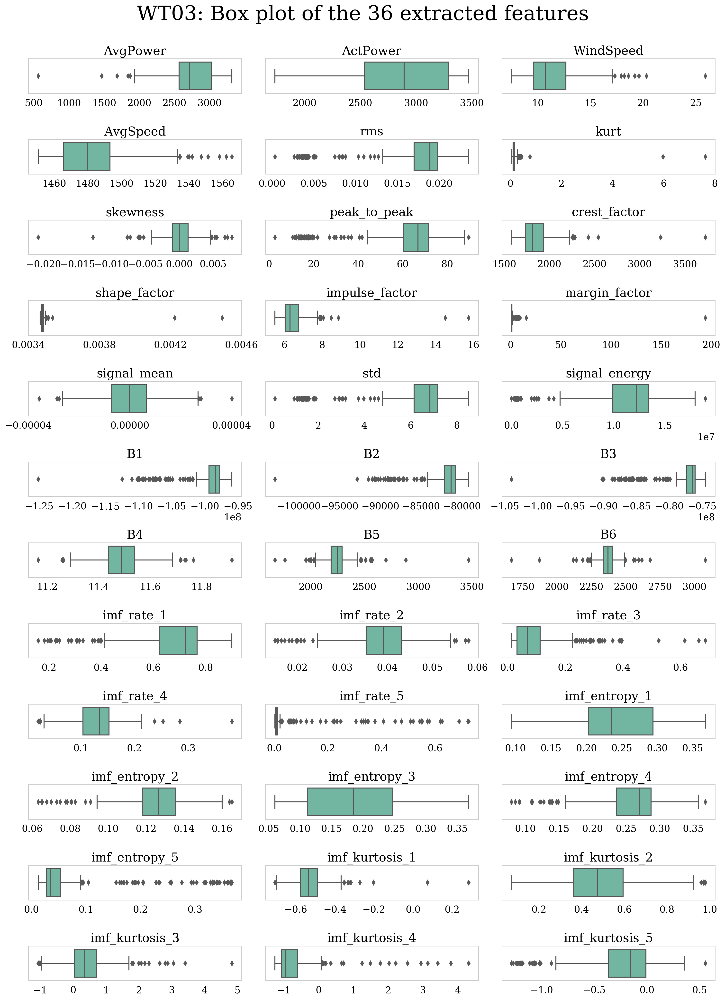

In [109]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.ticker as plticker


#first_half_features = features_cleaned.columns[:len(features_cleaned.columns)//2]
#second_half_features = features_cleaned.columns[len(features_cleaned.columns)//2:]

#subsets=[first_half_features,second_half_features]

import time
start_time = time.time()

fig,axs = plt.subplots(9,4,figsize=(15,23))

fig.suptitle(f"WT0{str(wt_num)}: Box plot of the 36 extracted features",fontsize=30)

fig.tight_layout()
# plt.subplots_adjust(top=0.96)

i=1
for column in features_cleaned:
    if (column == 'Index' or column== 'Date'):
        continue

    ax = fig.add_subplot(13,3,i)
    ax.set_title(column,fontsize=18)
    sns.boxplot(features_cleaned[column],palette="Set2")
    ax.set_xlabel('')
    ax.grid(False)

    if (column == 'shape_factor' or column=='signal_mean'):
        #loc = plticker.MultipleLocator(base=5) # this locator puts ticks at regular intervals
        #ax.xaxis.set_major_locator(loc)
        ax.set_xticks(ax.get_xticks()[::2])


    # Removing y ticks and y labels
    frame1 = plt.gca()
    frame1.axes.yaxis.set_ticklabels([])
    frame1.axes.get_yaxis().set_ticks([])

    for tick in ax.xaxis.get_major_ticks():
                tick.label.set_fontsize(14) 

    i+=1

# Remove the empty plots
flat = axs.flatten()
for a in flat:
    fig.delaxes(a)



# fig.subplots_adjust(hspace=0.9)
fig.tight_layout(rect=[0, 0.03, 1, 0.95])
print("--- %s seconds ---" % (time.time() - start_time))

#fig.savefig(f"../../plots/box_plots/boxplot_WT0{str(wt_num)}.png",format='png',bbox_inches='tight')

plt.show()


In [151]:
# The whole DF
display(Markdown(f'<span style="color: #2a9d8f; font-size: 20px">Features cleaned:</span>'))
print(wt_num)
df=kmeans('all_36_features_initial',wt_num, features_cleaned,20,print_latex=True,plottitle='All 36 features initially')
display(df)

# plot_k_means_tuning(wt_num, df,'All 36 features')

<span style="color: #2a9d8f; font-size: 20px">Features cleaned:</span>

3
Marker-styles not there.


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,219.0,202.091324,37.0,17.0
1,41.0,204.341463,6.0,15.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,164.0,189.475610,24.0,15.0
1,41.0,204.341463,6.0,15.0
2,55.0,239.709091,13.0,24.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,37.0,214.378378,6.0,16.0
1,53.0,239.716981,13.0,25.0
2,140.0,191.707143,20.0,14.0
3,30.0,172.000000,4.0,13.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,19.0,235.105263,3.0,16.0
1,53.0,239.716981,13.0,25.0
2,138.0,195.130435,20.0,14.0
3,28.0,165.178571,4.0,14.0
4,22.0,177.772727,3.0,14.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,40.0,234.375000,8.0,20.0
1,20.0,228.100000,3.0,15.0
2,87.0,180.310345,7.0,8.0
3,24.0,189.041667,5.0,21.0
4,68.0,215.573529,17.0,25.0
5,21.0,181.714286,3.0,14.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,40.0,234.375000,8.0,20.0
1,12.0,232.916667,2.0,17.0
2,87.0,180.310345,7.0,8.0
3,24.0,189.041667,5.0,21.0
4,68.0,215.573529,17.0,25.0
5,14.0,183.500000,2.0,14.0
6,15.0,200.933333,2.0,13.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,4.0,293.250000,2.0,50.0
1,89.0,180.808989,7.0,8.0
2,15.0,200.933333,2.0,13.0
3,62.0,212.935484,16.0,26.0
4,23.0,179.826087,4.0,17.0
5,12.0,232.916667,2.0,17.0
6,41.0,235.487805,8.0,20.0
7,14.0,183.500000,2.0,14.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,13.0,245.307692,3.0,23.0
1,53.0,191.452830,11.0,21.0
2,35.0,139.142857,0.0,0.0
3,13.0,173.384615,0.0,0.0
4,35.0,228.342857,7.0,20.0
5,22.0,189.318182,5.0,23.0
6,8.0,243.250000,3.0,38.0
7,9.0,156.555556,0.0,0.0
8,72.0,231.444444,14.0,19.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,13.0,245.307692,3.0,23.0
1,55.0,196.890909,12.0,22.0
2,32.0,136.656250,0.0,0.0
3,13.0,173.384615,0.0,0.0
4,35.0,248.657143,9.0,26.0
5,21.0,179.238095,4.0,19.0
6,8.0,243.250000,3.0,38.0
7,8.0,157.750000,0.0,0.0
8,55.0,217.727273,9.0,16.0
9,20.0,217.050000,3.0,15.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,13.0,245.307692,3.0,23.0
1,45.0,232.688889,12.0,27.0
2,34.0,135.088235,0.0,0.0
3,13.0,173.384615,0.0,0.0
4,29.0,249.379310,7.0,24.0
5,19.0,192.315789,4.0,21.0
6,8.0,243.250000,3.0,38.0
7,8.0,157.750000,0.0,0.0
8,49.0,211.102041,7.0,14.0
9,20.0,217.050000,3.0,15.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,29.0,126.896552,0.0,0.0
1,13.0,245.307692,3.0,23.0
2,25.0,251.000000,6.0,24.0
3,14.0,187.142857,1.0,7.0
4,30.0,154.666667,5.0,17.0
5,20.0,183.900000,4.0,20.0
6,20.0,217.050000,3.0,15.0
7,40.0,242.900000,12.0,30.0
8,5.0,148.800000,1.0,20.0
9,3.0,281.666667,1.0,33.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,4.0,293.250000,2.0,50.0
1,24.0,146.833333,2.0,8.0
2,14.0,187.142857,1.0,7.0
3,24.0,252.208333,6.0,25.0
4,20.0,183.900000,4.0,20.0
5,4.0,241.250000,1.0,25.0
6,20.0,212.650000,2.0,10.0
7,7.0,225.714286,2.0,29.0
8,9.0,247.111111,2.0,22.0
9,26.0,139.500000,0.0,0.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,13.0,183.615385,1.0,8.0
1,31.0,135.451613,0.0,0.0
2,27.0,248.777778,6.0,22.0
3,7.0,243.142857,2.0,29.0
4,16.0,191.562500,1.0,6.0
5,21.0,159.190476,4.0,19.0
6,7.0,245.714286,1.0,14.0
7,41.0,242.512195,12.0,29.0
8,32.0,194.062500,5.0,16.0
9,3.0,328.666667,2.0,67.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,13.0,183.615385,1.0,8.0
1,30.0,133.966667,0.0,0.0
2,20.0,262.750000,8.0,40.0
3,7.0,243.142857,2.0,29.0
4,16.0,186.312500,1.0,6.0
5,20.0,160.300000,4.0,20.0
6,7.0,245.714286,1.0,14.0
7,29.0,221.413793,6.0,21.0
8,32.0,196.656250,5.0,16.0
9,3.0,328.666667,2.0,67.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,8.0,267.750000,2.0,25.0
1,26.0,222.653846,6.0,23.0
2,17.0,125.352941,0.0,0.0
3,11.0,126.818182,0.0,0.0
4,23.0,251.391304,6.0,26.0
5,19.0,192.315789,4.0,21.0
6,5.0,193.800000,1.0,20.0
7,10.0,193.100000,0.0,0.0
8,38.0,226.157895,6.0,16.0
9,18.0,199.777778,1.0,6.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,8.0,267.750000,2.0,25.0
1,26.0,222.653846,6.0,23.0
2,17.0,125.352941,0.0,0.0
3,11.0,126.818182,0.0,0.0
4,24.0,250.958333,6.0,25.0
5,19.0,192.315789,4.0,21.0
6,5.0,193.800000,1.0,20.0
7,10.0,193.100000,0.0,0.0
8,38.0,226.157895,6.0,16.0
9,16.0,191.562500,1.0,6.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,8.0,267.750000,2.0,25.0
1,26.0,222.653846,6.0,23.0
2,17.0,125.352941,0.0,0.0
3,11.0,126.818182,0.0,0.0
4,24.0,250.958333,6.0,25.0
5,19.0,192.315789,4.0,21.0
6,5.0,193.800000,1.0,20.0
7,4.0,212.500000,0.0,0.0
8,41.0,225.390244,6.0,15.0
9,17.0,197.352941,1.0,6.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,10.0,121.600000,1.0,10.0
1,12.0,188.666667,3.0,25.0
2,10.0,138.900000,0.0,0.0
3,21.0,255.142857,6.0,29.0
4,18.0,199.777778,1.0,6.0
5,39.0,200.743590,5.0,13.0
6,6.0,266.833333,1.0,17.0
7,23.0,259.521739,8.0,35.0
8,22.0,206.954545,4.0,18.0
9,9.0,189.888889,0.0,0.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,7.0,271.714286,2.0,29.0
1,22.0,231.363636,6.0,27.0
2,17.0,125.352941,0.0,0.0
3,11.0,147.818182,0.0,0.0
4,22.0,254.500000,6.0,27.0
5,19.0,192.315789,4.0,21.0
6,5.0,193.800000,1.0,20.0
7,3.0,205.000000,0.0,0.0
8,36.0,230.138889,6.0,17.0
9,16.0,191.562500,1.0,6.0



\begin{tabular}{rrrr}
\toprule
 max\_cluster\_number &  intervals\_in\_max\_cluster &  intervals\_greater\_than\_350 &  max\_percentages \\
\midrule
                  2 &                       219 &                          37 &             17.0 \\
                  3 &                        55 &                          13 &             24.0 \\
                  4 &                        53 &                          13 &             25.0 \\
                  5 &                        53 &                          13 &             25.0 \\
                  6 &                        68 &                          17 &             25.0 \\
                  7 &                        68 &                          17 &             25.0 \\
                  8 &                         4 &                           2 &             50.0 \\
                  9 &                         8 &                           3 &             38.0 \\
                 10 &                         8 & 

,max_cluster_number,intervals_in_max_cluster,intervals_greater_than_350,max_percentages
0,2,219,37,17.0
1,3,55,13,24.0
2,4,53,13,25.0
3,5,53,13,25.0
4,6,68,17,25.0
5,7,68,17,25.0
6,8,4,2,50.0
7,9,8,3,38.0
8,10,8,3,38.0
9,11,8,3,38.0


### Selecting K=7 and producing plots

In [48]:
features_cleaned.shape

(262, 37)

Marker-styles not there.


SystemError: <built-in method write of _io.BufferedWriter object at 0x126edc590> returned a result with an error set

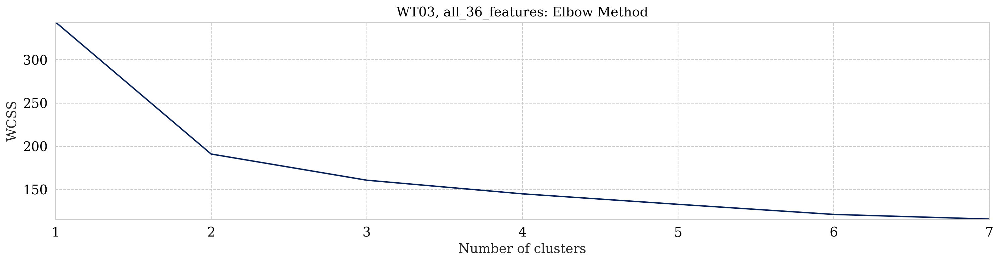

In [152]:
#ddef run_kmeans(plottitle,wt_num, dataset_name, data_set,k,selected_cluster=None,**features_to_pairplot):
wt_num_string='3'
assigned = run_kmeans('Complete data set',wt_num_string,'all_36_features', features_cleaned,7,
                      selected_cluster=4,
                      fset1=['AvgPower','B1'],
                      fset2=['AvgPower','B5'],
                      fset3=['AvgPower','imf_kurtosis_5'],
                      fset4=['AvgSpeed','rms','B4'],
                      fset5=['AvgPower','AvgSpeed','imf_entropy_4', 'imf_entropy_5','B4'],
                      fset6=['AvgPower','AvgSpeed','B1', 'B2','B3'],
                      fset7=['AvgPower','AvgSpeed','B1'],
                      fset8=['AvgPower','B1','B3','imf_kurtosis_5'])

# Study the printed table as well.

#### Now, running the other subsets

In [153]:
wt_num = '3'
for i,features in enumerate(features_sets):
    try:
        features=features.drop(['cluster_assigned'],axis=1)
    except:
        print("Could not remove cluster_assigned")
    print(features.columns)
    display(Markdown(f'<span style="color: #2a9d8f; font-size: 20px">{features_sets_names[i]}:</span>'))    
    df=kmeans(features_sets_names[i],wt_num, features,20,print_latex=False,plottitle=f'{features_sets_names[i]} Initially')
    display(df)
    plt.show()

Could not remove cluster_assigned
Index(['Index', 'AvgPower', 'ActPower', 'WindSpeed', 'AvgSpeed', 'B1', 'B2',
       'B3', 'B4', 'B5', 'B6'],
      dtype='object')


<span style="color: #2a9d8f; font-size: 20px">op_and_bispec_features:</span>

Marker-styles not there.


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,39.0,208.487179,6.0,15.0
1,221.0,201.380090,37.0,17.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,128.0,206.140625,18.0,14.0
1,96.0,195.145833,19.0,20.0
2,36.0,208.777778,6.0,17.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,36.0,208.777778,6.0,17.0
1,111.0,207.873874,15.0,14.0
2,32.0,216.531250,10.0,31.0
3,81.0,186.629630,12.0,15.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,72.0,203.416667,8.0,11.0
1,16.0,245.250000,2.0,12.0
2,23.0,182.913043,4.0,17.0
3,70.0,189.714286,14.0,20.0
4,79.0,209.860759,15.0,19.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,68.0,208.338235,9.0,13.0
1,15.0,242.733333,2.0,13.0
2,23.0,182.913043,4.0,17.0
3,56.0,170.892857,7.0,12.0
4,68.0,207.529412,11.0,16.0
5,30.0,231.300000,10.0,33.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,13.0,232.000000,2.0,15.0
1,26.0,225.576923,9.0,35.0
2,71.0,205.985915,9.0,13.0
3,19.0,187.052632,4.0,21.0
4,52.0,167.942308,6.0,12.0
5,11.0,226.000000,1.0,9.0
6,68.0,211.132353,12.0,18.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,62.0,210.919355,11.0,18.0
1,18.0,223.444444,2.0,11.0
2,15.0,192.866667,4.0,27.0
3,20.0,215.050000,6.0,30.0
4,67.0,207.373134,9.0,13.0
5,50.0,170.500000,5.0,10.0
6,18.0,194.111111,4.0,22.0
7,10.0,243.000000,2.0,20.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,62.0,210.919355,11.0,18.0
1,7.0,211.428571,1.0,14.0
2,15.0,192.866667,4.0,27.0
3,20.0,215.050000,6.0,30.0
4,67.0,207.373134,9.0,13.0
5,50.0,170.500000,5.0,10.0
6,18.0,194.111111,4.0,22.0
7,10.0,243.000000,2.0,20.0
8,11.0,231.090909,1.0,9.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,47.0,224.085106,10.0,21.0
1,9.0,215.666667,1.0,11.0
2,9.0,231.222222,1.0,11.0
3,25.0,201.320000,4.0,16.0
4,9.0,239.666667,2.0,22.0
5,20.0,199.650000,6.0,30.0
6,18.0,194.111111,4.0,22.0
7,43.0,172.976744,4.0,9.0
8,61.0,198.016393,6.0,10.0
9,19.0,204.631579,5.0,26.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,28.0,181.107143,2.0,7.0
1,13.0,238.846154,5.0,38.0
2,5.0,169.200000,0.0,0.0
3,14.0,240.642857,2.0,14.0
4,47.0,171.148936,6.0,13.0
5,40.0,224.000000,9.0,22.0
6,17.0,194.176471,4.0,24.0
7,34.0,204.794118,6.0,18.0
8,21.0,195.619048,4.0,19.0
9,7.0,217.428571,1.0,14.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,30.0,199.466667,5.0,17.0
1,40.0,166.400000,3.0,8.0
2,16.0,188.375000,3.0,19.0
3,8.0,251.625000,3.0,38.0
4,7.0,211.428571,1.0,14.0
5,19.0,206.947368,5.0,26.0
6,23.0,169.565217,2.0,9.0
7,11.0,231.090909,1.0,9.0
8,39.0,212.307692,4.0,10.0
9,46.0,231.565217,11.0,24.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,32.0,206.937500,6.0,19.0
1,10.0,109.900000,0.0,0.0
2,16.0,188.375000,3.0,19.0
3,9.0,241.000000,2.0,22.0
4,7.0,211.428571,1.0,14.0
5,20.0,215.050000,6.0,30.0
6,23.0,169.565217,2.0,9.0
7,11.0,231.090909,1.0,9.0
8,36.0,206.944444,2.0,6.0
9,37.0,242.513514,10.0,27.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,30.0,200.533333,5.0,17.0
1,12.0,115.583333,0.0,0.0
2,16.0,188.375000,3.0,19.0
3,9.0,241.000000,2.0,22.0
4,7.0,211.428571,1.0,14.0
5,20.0,215.050000,6.0,30.0
6,23.0,169.565217,2.0,9.0
7,11.0,231.090909,1.0,9.0
8,35.0,212.342857,2.0,6.0
9,37.0,243.378378,10.0,27.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,31.0,202.548387,5.0,16.0
1,11.0,103.727273,0.0,0.0
2,16.0,188.375000,3.0,19.0
3,9.0,250.555556,3.0,33.0
4,7.0,211.428571,1.0,14.0
5,20.0,218.700000,5.0,25.0
6,23.0,169.565217,2.0,9.0
7,11.0,231.090909,1.0,9.0
8,35.0,212.342857,2.0,6.0
9,34.0,250.147059,10.0,29.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,31.0,202.548387,5.0,16.0
1,9.0,99.222222,0.0,0.0
2,16.0,188.375000,3.0,19.0
3,7.0,266.000000,2.0,29.0
4,7.0,211.428571,1.0,14.0
5,16.0,218.062500,5.0,31.0
6,23.0,169.565217,2.0,9.0
7,11.0,231.090909,1.0,9.0
8,35.0,212.342857,2.0,6.0
9,34.0,250.147059,10.0,29.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,10.0,212.800000,3.0,30.0
1,31.0,170.580645,2.0,6.0
2,7.0,219.428571,1.0,14.0
3,12.0,225.666667,3.0,25.0
4,17.0,194.176471,4.0,24.0
5,14.0,202.071429,2.0,14.0
6,11.0,226.000000,1.0,9.0
7,8.0,236.750000,2.0,25.0
8,31.0,248.451613,9.0,29.0
9,21.0,212.142857,3.0,14.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,10.0,212.800000,3.0,30.0
1,31.0,170.580645,2.0,6.0
2,7.0,219.428571,1.0,14.0
3,12.0,225.666667,3.0,25.0
4,17.0,194.176471,4.0,24.0
5,14.0,202.071429,2.0,14.0
6,10.0,225.300000,1.0,10.0
7,8.0,236.750000,2.0,25.0
8,31.0,248.451613,9.0,29.0
9,21.0,212.142857,3.0,14.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,14.0,164.285714,1.0,7.0
1,8.0,268.125000,2.0,25.0
2,19.0,206.263158,3.0,16.0
3,39.0,213.769231,6.0,15.0
4,19.0,186.473684,3.0,16.0
5,24.0,176.666667,2.0,8.0
6,8.0,252.625000,1.0,12.0
7,19.0,213.105263,6.0,32.0
8,1.0,409.000000,1.0,100.0
9,31.0,240.516129,7.0,23.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,24.0,213.666667,6.0,25.0
1,3.0,285.333333,2.0,67.0
2,11.0,207.090909,4.0,36.0
3,12.0,218.500000,4.0,33.0
4,6.0,228.000000,0.0,0.0
5,7.0,179.571429,1.0,14.0
6,13.0,172.307692,1.0,8.0
7,18.0,168.111111,1.0,6.0
8,20.0,212.850000,4.0,20.0
9,12.0,157.166667,0.0,0.0


,max_cluster_number,intervals_in_max_cluster,intervals_greater_than_350,max_percentages
0,2,221,37,17.0
1,3,96,19,20.0
2,4,32,10,31.0
3,5,70,14,20.0
4,6,30,10,33.0
5,7,26,9,35.0
6,8,20,6,30.0
7,9,20,6,30.0
8,10,20,6,30.0
9,11,13,5,38.0


Could not remove cluster_assigned
Index(['Index', 'AvgPower', 'ActPower', 'WindSpeed', 'AvgSpeed', 'rms', 'kurt',
       'skewness', 'peak_to_peak', 'crest_factor', 'shape_factor',
       'impulse_factor', 'margin_factor', 'signal_mean', 'std',
       'signal_energy'],
      dtype='object')


<span style="color: #2a9d8f; font-size: 20px">op_and_time_features:</span>

Marker-styles not there.


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,219.0,202.091324,37.0,17.0
1,41.0,204.341463,6.0,15.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,41.0,204.341463,6.0,15.0
1,119.0,208.243697,17.0,14.0
2,100.0,194.770000,20.0,20.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,36.0,213.361111,6.0,17.0
1,105.0,200.504762,13.0,12.0
2,99.0,193.212121,19.0,19.0
3,20.0,238.700000,5.0,25.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,32.0,205.250000,10.0,31.0
1,93.0,201.376344,12.0,13.0
2,21.0,252.380952,5.0,24.0
3,40.0,209.150000,6.0,15.0
4,74.0,184.783784,10.0,14.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,30.0,193.000000,8.0,27.0
1,86.0,198.372093,10.0,12.0
2,19.0,241.315789,5.0,26.0
3,39.0,212.435897,6.0,15.0
4,24.0,195.250000,5.0,21.0
5,62.0,197.258065,9.0,15.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,87.0,198.517241,10.0,11.0
1,24.0,189.708333,4.0,17.0
2,16.0,238.312500,2.0,12.0
3,20.0,252.950000,5.0,25.0
4,28.0,203.678571,8.0,29.0
5,23.0,201.217391,5.0,22.0
6,62.0,187.241935,9.0,15.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,70.0,209.742857,9.0,13.0
1,23.0,182.913043,4.0,17.0
2,32.0,158.031250,2.0,6.0
3,17.0,244.647059,2.0,12.0
4,50.0,192.660000,8.0,16.0
5,22.0,202.772727,5.0,23.0
6,28.0,203.678571,8.0,29.0
7,18.0,263.000000,5.0,28.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,20.0,212.000000,5.0,25.0
1,23.0,182.913043,4.0,17.0
2,19.0,253.000000,5.0,26.0
3,68.0,209.911765,11.0,16.0
4,17.0,244.647059,2.0,12.0
5,38.0,175.052632,2.0,5.0
6,15.0,246.200000,6.0,40.0
7,16.0,183.187500,4.0,25.0
8,44.0,174.386364,4.0,9.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,29.0,195.310345,5.0,17.0
1,22.0,188.500000,4.0,18.0
2,33.0,164.878788,1.0,3.0
3,14.0,240.642857,2.0,14.0
4,44.0,176.045455,4.0,9.0
5,21.0,199.000000,5.0,24.0
6,28.0,203.678571,8.0,29.0
7,45.0,231.933333,9.0,20.0
8,15.0,252.866667,3.0,20.0
9,9.0,239.666667,2.0,22.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,32.0,225.468750,6.0,19.0
1,23.0,182.913043,4.0,17.0
2,42.0,208.928571,6.0,14.0
3,17.0,244.647059,2.0,12.0
4,16.0,183.187500,4.0,25.0
5,39.0,180.384615,4.0,10.0
6,16.0,190.312500,4.0,25.0
7,20.0,143.450000,1.0,5.0
8,16.0,241.937500,6.0,38.0
9,19.0,191.210526,1.0,5.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,32.0,225.468750,6.0,19.0
1,13.0,215.692308,3.0,23.0
2,42.0,208.928571,6.0,14.0
3,12.0,245.833333,2.0,17.0
4,16.0,183.187500,4.0,25.0
5,39.0,180.384615,4.0,10.0
6,16.0,190.312500,4.0,25.0
7,20.0,143.450000,1.0,5.0
8,16.0,241.937500,6.0,38.0
9,19.0,191.210526,1.0,5.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,20.0,155.100000,2.0,10.0
1,5.0,172.400000,0.0,0.0
2,15.0,246.200000,6.0,40.0
3,9.0,133.777778,1.0,11.0
4,21.0,198.142857,5.0,24.0
5,56.0,224.000000,10.0,18.0
6,16.0,183.187500,4.0,25.0
7,8.0,159.750000,0.0,0.0
8,11.0,236.363636,3.0,27.0
9,45.0,177.244444,4.0,9.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,20.0,155.100000,2.0,10.0
1,5.0,172.400000,0.0,0.0
2,15.0,246.200000,6.0,40.0
3,9.0,133.777778,1.0,11.0
4,21.0,198.142857,5.0,24.0
5,56.0,224.000000,10.0,18.0
6,16.0,183.187500,4.0,25.0
7,7.0,172.857143,0.0,0.0
8,10.0,230.400000,3.0,30.0
9,45.0,177.244444,4.0,9.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,20.0,146.050000,1.0,5.0
1,5.0,172.400000,0.0,0.0
2,16.0,231.187500,6.0,38.0
3,9.0,133.777778,1.0,11.0
4,26.0,189.384615,4.0,15.0
5,43.0,222.255814,7.0,16.0
6,16.0,183.187500,4.0,25.0
7,7.0,172.857143,0.0,0.0
8,10.0,230.400000,3.0,30.0
9,40.0,179.550000,4.0,10.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,17.0,145.000000,1.0,6.0
1,5.0,172.400000,0.0,0.0
2,14.0,234.714286,5.0,36.0
3,9.0,133.777778,1.0,11.0
4,17.0,233.176471,4.0,24.0
5,29.0,158.344828,2.0,7.0
6,16.0,183.187500,4.0,25.0
7,7.0,172.857143,0.0,0.0
8,10.0,230.400000,3.0,30.0
9,40.0,178.675000,4.0,10.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,13.0,190.692308,3.0,23.0
1,4.0,206.250000,0.0,0.0
2,32.0,206.781250,6.0,19.0
3,12.0,238.250000,5.0,42.0
4,18.0,250.222222,5.0,28.0
5,20.0,196.100000,5.0,25.0
6,4.0,212.500000,0.0,0.0
7,23.0,161.956522,3.0,13.0
8,25.0,197.600000,2.0,8.0
9,9.0,234.555556,3.0,33.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,12.0,172.750000,2.0,17.0
1,4.0,206.250000,0.0,0.0
2,30.0,203.600000,5.0,17.0
3,10.0,123.800000,0.0,0.0
4,18.0,250.222222,5.0,28.0
5,21.0,199.000000,5.0,24.0
6,4.0,212.500000,0.0,0.0
7,18.0,191.666667,4.0,22.0
8,25.0,213.880000,4.0,16.0
9,9.0,234.555556,3.0,33.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,17.0,145.000000,1.0,6.0
1,5.0,172.400000,0.0,0.0
2,13.0,239.307692,5.0,38.0
3,9.0,133.777778,1.0,11.0
4,18.0,226.833333,4.0,22.0
5,26.0,160.692308,2.0,8.0
6,15.0,192.600000,4.0,27.0
7,7.0,172.857143,0.0,0.0
8,10.0,230.400000,3.0,30.0
9,24.0,156.083333,2.0,8.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,7.0,129.714286,0.0,0.0
1,7.0,172.857143,0.0,0.0
2,26.0,144.307692,0.0,0.0
3,13.0,239.307692,5.0,38.0
4,18.0,208.055556,2.0,11.0
5,13.0,240.000000,2.0,15.0
6,16.0,213.437500,5.0,31.0
7,25.0,214.360000,4.0,16.0
8,1.0,187.000000,0.0,0.0
9,13.0,204.923077,4.0,31.0


,max_cluster_number,intervals_in_max_cluster,intervals_greater_than_350,max_percentages
0,2,219,37,17.0
1,3,100,20,20.0
2,4,20,5,25.0
3,5,32,10,31.0
4,6,30,8,27.0
5,7,28,8,29.0
6,8,28,8,29.0
7,9,15,6,40.0
8,10,28,8,29.0
9,11,16,6,38.0


Could not remove cluster_assigned
Index(['Index', 'AvgPower', 'ActPower', 'WindSpeed', 'AvgSpeed',
       'imf_kurtosis_1', 'imf_kurtosis_2', 'imf_kurtosis_3', 'imf_kurtosis_4',
       'imf_kurtosis_5'],
      dtype='object')


<span style="color: #2a9d8f; font-size: 20px">op_and_imf_kurtosis_features:</span>

Marker-styles not there.


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,148.0,202.824324,21.0,14.0
1,112.0,201.946429,22.0,20.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,131.0,202.801527,19.0,15.0
1,33.0,212.484848,4.0,12.0
2,96.0,198.510417,20.0,21.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,30.0,220.066667,4.0,13.0
1,87.0,207.068966,16.0,18.0
2,103.0,197.048544,13.0,13.0
3,40.0,193.075000,10.0,25.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,101.0,196.920792,12.0,12.0
1,38.0,202.263158,11.0,29.0
2,24.0,203.833333,3.0,12.0
3,72.0,209.236111,14.0,19.0
4,25.0,204.160000,3.0,12.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,51.0,239.470588,13.0,25.0
1,31.0,195.548387,9.0,29.0
2,25.0,204.560000,3.0,12.0
3,66.0,204.106061,11.0,17.0
4,24.0,215.125000,4.0,17.0
5,63.0,168.460317,3.0,5.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,46.0,201.130435,7.0,15.0
1,49.0,241.959184,13.0,27.0
2,47.0,169.085106,2.0,4.0
3,17.0,180.176471,1.0,6.0
4,33.0,211.393939,10.0,30.0
5,46.0,197.065217,7.0,15.0
6,22.0,203.500000,3.0,14.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,18.0,224.388889,3.0,17.0
1,41.0,190.902439,7.0,17.0
2,47.0,161.617021,2.0,4.0
3,24.0,211.333333,6.0,25.0
4,17.0,208.470588,5.0,29.0
5,24.0,174.166667,2.0,8.0
6,41.0,223.853659,9.0,22.0
7,48.0,233.333333,9.0,19.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,4.0,214.250000,0.0,0.0
1,27.0,176.666667,6.0,22.0
2,40.0,160.400000,1.0,2.0
3,16.0,163.437500,1.0,6.0
4,45.0,245.888889,13.0,29.0
5,39.0,205.666667,7.0,18.0
6,20.0,206.800000,5.0,25.0
7,51.0,211.882353,7.0,14.0
8,18.0,219.444444,3.0,17.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,38.0,261.789474,11.0,29.0
1,18.0,201.888889,2.0,11.0
2,17.0,174.058824,3.0,18.0
3,24.0,238.125000,9.0,38.0
4,29.0,147.827586,0.0,0.0
5,9.0,235.555556,1.0,11.0
6,38.0,174.763158,4.0,11.0
7,23.0,168.130435,0.0,0.0
8,46.0,221.869565,11.0,24.0
9,18.0,181.055556,2.0,11.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,8.0,200.500000,1.0,12.0
1,23.0,205.217391,6.0,26.0
2,32.0,138.875000,0.0,0.0
3,18.0,193.111111,5.0,28.0
4,41.0,205.292683,7.0,17.0
5,15.0,194.666667,2.0,13.0
6,20.0,171.700000,3.0,15.0
7,12.0,198.416667,1.0,8.0
8,45.0,246.266667,10.0,22.0
9,42.0,224.000000,8.0,19.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,8.0,200.500000,1.0,12.0
1,22.0,196.272727,5.0,23.0
2,30.0,153.533333,0.0,0.0
3,18.0,193.111111,5.0,28.0
4,41.0,205.292683,7.0,17.0
5,15.0,194.666667,2.0,13.0
6,20.0,171.700000,3.0,15.0
7,12.0,198.416667,1.0,8.0
8,30.0,270.133333,9.0,30.0
9,34.0,243.882353,9.0,26.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,26.0,182.192308,3.0,12.0
1,26.0,209.576923,4.0,15.0
2,18.0,193.111111,5.0,28.0
3,18.0,181.055556,2.0,11.0
4,30.0,135.633333,0.0,0.0
5,46.0,229.173913,11.0,24.0
6,1.0,193.000000,0.0,0.0
7,3.0,247.666667,0.0,0.0
8,30.0,204.833333,5.0,17.0
9,13.0,177.538462,1.0,8.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,10.0,263.700000,5.0,50.0
1,19.0,139.421053,0.0,0.0
2,15.0,162.600000,1.0,7.0
3,13.0,152.615385,2.0,15.0
4,27.0,172.703704,3.0,11.0
5,6.0,246.666667,1.0,17.0
6,30.0,237.200000,7.0,23.0
7,23.0,204.521739,2.0,9.0
8,25.0,217.920000,5.0,20.0
9,34.0,255.470588,9.0,26.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,23.0,196.000000,5.0,22.0
1,24.0,217.375000,4.0,17.0
2,17.0,215.882353,5.0,29.0
3,18.0,181.055556,2.0,11.0
4,22.0,139.363636,0.0,0.0
5,42.0,227.428571,9.0,21.0
6,1.0,193.000000,0.0,0.0
7,3.0,247.666667,0.0,0.0
8,24.0,172.708333,3.0,12.0
9,10.0,235.400000,1.0,10.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,7.0,227.428571,1.0,14.0
1,27.0,203.444444,6.0,22.0
2,30.0,138.900000,0.0,0.0
3,18.0,198.722222,5.0,28.0
4,19.0,246.842105,4.0,21.0
5,15.0,194.666667,2.0,13.0
6,17.0,174.294118,2.0,12.0
7,11.0,190.727273,1.0,9.0
8,23.0,270.347826,7.0,30.0
9,31.0,239.903226,7.0,23.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,23.0,196.000000,5.0,22.0
1,21.0,226.904762,4.0,19.0
2,17.0,215.882353,5.0,29.0
3,18.0,181.055556,2.0,11.0
4,27.0,182.555556,2.0,7.0
5,33.0,228.181818,7.0,21.0
6,1.0,193.000000,0.0,0.0
7,3.0,247.666667,0.0,0.0
8,23.0,170.782609,3.0,13.0
9,10.0,235.400000,1.0,10.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,2.0,193.500000,0.0,0.0
1,22.0,191.090909,3.0,14.0
2,14.0,179.214286,3.0,21.0
3,21.0,222.619048,3.0,14.0
4,19.0,194.263158,3.0,16.0
5,33.0,223.000000,6.0,18.0
6,13.0,162.153846,1.0,8.0
7,4.0,187.500000,0.0,0.0
8,10.0,238.700000,1.0,10.0
9,23.0,130.434783,0.0,0.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,2.0,193.500000,0.0,0.0
1,22.0,191.090909,3.0,14.0
2,14.0,179.214286,3.0,21.0
3,21.0,222.619048,3.0,14.0
4,19.0,194.263158,3.0,16.0
5,33.0,223.000000,6.0,18.0
6,13.0,162.153846,1.0,8.0
7,1.0,193.000000,0.0,0.0
8,10.0,238.700000,1.0,10.0
9,23.0,130.434783,0.0,0.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,7.0,227.428571,1.0,14.0
1,11.0,201.545455,4.0,36.0
2,22.0,139.363636,0.0,0.0
3,15.0,208.466667,5.0,33.0
4,15.0,213.800000,2.0,13.0
5,9.0,209.666667,2.0,22.0
6,16.0,177.375000,2.0,12.0
7,9.0,226.444444,1.0,11.0
8,12.0,210.583333,1.0,8.0
9,24.0,259.625000,7.0,29.0


,max_cluster_number,intervals_in_max_cluster,intervals_greater_than_350,max_percentages
0,2,112,22,20.0
1,3,96,20,21.0
2,4,40,10,25.0
3,5,38,11,29.0
4,6,31,9,29.0
5,7,33,10,30.0
6,8,17,5,29.0
7,9,45,13,29.0
8,10,24,9,38.0
9,11,18,5,28.0


Could not remove cluster_assigned
Index(['Index', 'AvgPower', 'ActPower', 'WindSpeed', 'AvgSpeed', 'imf_rate_1',
       'imf_rate_2', 'imf_rate_3', 'imf_rate_4', 'imf_rate_5', 'imf_entropy_1',
       'imf_entropy_2', 'imf_entropy_3', 'imf_entropy_4', 'imf_entropy_5'],
      dtype='object')


<span style="color: #2a9d8f; font-size: 20px">op_and_imf_features:</span>

Marker-styles not there.


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,30.0,210.600000,4.0,13.0
1,230.0,201.382609,39.0,17.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,59.0,240.271186,14.0,24.0
1,173.0,187.283237,25.0,14.0
2,28.0,216.428571,4.0,14.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,45.0,234.600000,9.0,20.0
1,111.0,176.441441,11.0,10.0
2,27.0,215.148148,4.0,15.0
3,77.0,216.688312,19.0,25.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,33.0,161.909091,5.0,15.0
1,87.0,188.080460,8.0,9.0
2,71.0,214.352113,17.0,24.0
3,27.0,215.148148,4.0,15.0
4,42.0,235.761905,9.0,21.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,87.0,188.080460,8.0,9.0
1,32.0,166.687500,5.0,16.0
2,70.0,213.828571,17.0,24.0
3,13.0,179.769231,1.0,8.0
4,42.0,235.761905,9.0,21.0
5,16.0,233.250000,3.0,19.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,14.0,229.928571,3.0,21.0
1,83.0,188.337349,8.0,10.0
2,16.0,233.250000,3.0,19.0
3,37.0,239.648649,8.0,22.0
4,13.0,179.769231,1.0,8.0
5,32.0,166.687500,5.0,16.0
6,65.0,207.923077,15.0,23.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,82.0,188.109756,8.0,10.0
1,17.0,180.764706,1.0,6.0
2,18.0,210.166667,3.0,17.0
3,26.0,164.807692,4.0,15.0
4,12.0,249.666667,3.0,25.0
5,41.0,247.195122,12.0,29.0
6,26.0,253.461538,6.0,23.0
7,38.0,167.078947,6.0,16.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,60.0,213.383333,8.0,13.0
1,17.0,180.764706,1.0,6.0
2,18.0,210.166667,3.0,17.0
3,23.0,167.695652,4.0,17.0
4,12.0,249.666667,3.0,25.0
5,33.0,257.393939,11.0,33.0
6,27.0,250.888889,6.0,22.0
7,36.0,168.138889,6.0,17.0
8,34.0,141.264706,1.0,3.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,12.0,249.666667,3.0,25.0
1,56.0,211.553571,7.0,12.0
2,18.0,210.166667,3.0,17.0
3,43.0,182.511628,8.0,19.0
4,14.0,196.857143,1.0,7.0
5,27.0,250.888889,6.0,22.0
6,33.0,137.272727,0.0,0.0
7,22.0,171.818182,4.0,18.0
8,26.0,270.115385,10.0,38.0
9,9.0,144.333333,1.0,11.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,56.0,208.107143,7.0,12.0
1,12.0,146.083333,1.0,8.0
2,31.0,163.064516,5.0,16.0
3,18.0,199.388889,1.0,6.0
4,9.0,304.777778,3.0,33.0
5,20.0,172.150000,4.0,20.0
6,45.0,246.555556,13.0,29.0
7,3.0,328.666667,2.0,67.0
8,10.0,199.000000,1.0,10.0
9,33.0,137.272727,0.0,0.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,52.0,209.346154,7.0,13.0
1,10.0,133.600000,0.0,0.0
2,16.0,203.187500,4.0,25.0
3,18.0,199.388889,1.0,6.0
4,9.0,304.777778,3.0,33.0
5,21.0,164.523810,4.0,19.0
6,35.0,250.714286,11.0,31.0
7,3.0,328.666667,2.0,67.0
8,10.0,199.000000,1.0,10.0
9,31.0,152.258065,1.0,3.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,13.0,179.769231,1.0,8.0
1,26.0,159.269231,2.0,8.0
2,4.0,293.250000,2.0,50.0
3,34.0,168.647059,6.0,18.0
4,12.0,230.583333,2.0,17.0
5,26.0,246.807692,6.0,23.0
6,26.0,146.153846,1.0,4.0
7,41.0,220.195122,5.0,12.0
8,21.0,272.571429,6.0,29.0
9,23.0,167.695652,4.0,17.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,23.0,261.695652,6.0,26.0
1,9.0,129.555556,1.0,11.0
2,30.0,264.466667,11.0,37.0
3,21.0,179.857143,4.0,19.0
4,9.0,254.333333,1.0,11.0
5,41.0,157.682927,3.0,7.0
6,2.0,329.000000,1.0,50.0
7,39.0,220.692308,4.0,10.0
8,7.0,205.857143,1.0,14.0
9,17.0,189.117647,1.0,6.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,9.0,120.555556,0.0,0.0
1,26.0,159.269231,2.0,8.0
2,4.0,293.250000,2.0,50.0
3,34.0,168.647059,6.0,18.0
4,7.0,236.285714,1.0,14.0
5,26.0,246.807692,6.0,23.0
6,26.0,146.153846,1.0,4.0
7,41.0,220.195122,5.0,12.0
8,21.0,272.571429,6.0,29.0
9,23.0,167.695652,4.0,17.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,9.0,120.555556,0.0,0.0
1,26.0,166.192308,3.0,12.0
2,4.0,293.250000,2.0,50.0
3,33.0,166.878788,6.0,18.0
4,7.0,236.285714,1.0,14.0
5,26.0,246.807692,6.0,23.0
6,6.0,163.666667,1.0,17.0
7,38.0,221.842105,4.0,11.0
8,21.0,272.571429,6.0,29.0
9,21.0,179.857143,4.0,19.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,9.0,120.555556,0.0,0.0
1,26.0,166.192308,3.0,12.0
2,4.0,293.250000,2.0,50.0
3,33.0,166.878788,6.0,18.0
4,6.0,266.833333,1.0,17.0
5,26.0,246.807692,6.0,23.0
6,6.0,163.666667,1.0,17.0
7,38.0,221.842105,4.0,11.0
8,21.0,272.571429,6.0,29.0
9,21.0,179.857143,4.0,19.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,5.0,219.800000,1.0,20.0
1,16.0,258.812500,6.0,38.0
2,34.0,194.852941,5.0,15.0
3,9.0,115.111111,0.0,0.0
4,11.0,207.545455,2.0,18.0
5,15.0,189.600000,1.0,7.0
6,23.0,149.913043,4.0,17.0
7,23.0,261.695652,6.0,26.0
8,28.0,222.071429,5.0,18.0
9,4.0,241.250000,1.0,25.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,29.0,165.034483,3.0,10.0
1,9.0,115.111111,0.0,0.0
2,15.0,189.600000,1.0,7.0
3,11.0,207.545455,2.0,18.0
4,3.0,267.666667,1.0,33.0
5,13.0,250.846154,5.0,38.0
6,22.0,263.727273,6.0,27.0
7,9.0,216.666667,3.0,33.0
8,25.0,137.000000,0.0,0.0
9,6.0,268.500000,1.0,17.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,29.0,165.034483,3.0,10.0
1,9.0,115.111111,0.0,0.0
2,15.0,189.600000,1.0,7.0
3,11.0,207.545455,2.0,18.0
4,3.0,267.666667,1.0,33.0
5,13.0,250.846154,5.0,38.0
6,22.0,263.727273,6.0,27.0
7,9.0,216.666667,3.0,33.0
8,25.0,137.000000,0.0,0.0
9,5.0,240.600000,1.0,20.0


,max_cluster_number,intervals_in_max_cluster,intervals_greater_than_350,max_percentages
0,2,230,39,17.0
1,3,59,14,24.0
2,4,77,19,25.0
3,5,71,17,24.0
4,6,70,17,24.0
5,7,65,15,23.0
6,8,41,12,29.0
7,9,33,11,33.0
8,10,26,10,38.0
9,11,3,2,67.0


Could not remove cluster_assigned
Index(['Index', 'AvgPower', 'WindSpeed', 'AvgSpeed', 'imf_rate_5',
       'imf_kurtosis_5', 'B1', 'B5'],
      dtype='object')


<span style="color: #2a9d8f; font-size: 20px">feature_mix:</span>

Marker-styles not there.


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,225.0,200.484444,38.0,17.0
1,35.0,215.057143,5.0,14.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,142.0,205.852113,23.0,16.0
1,87.0,191.068966,15.0,17.0
2,31.0,218.774194,5.0,16.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,133.0,208.180451,21.0,16.0
1,23.0,196.000000,4.0,17.0
2,20.0,228.100000,3.0,15.0
3,84.0,189.023810,15.0,18.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,67.0,184.671642,9.0,13.0
1,22.0,192.045455,4.0,18.0
2,123.0,206.024390,18.0,15.0
3,20.0,228.100000,3.0,15.0
4,28.0,219.107143,9.0,32.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,19.0,222.684211,3.0,16.0
1,64.0,183.578125,8.0,12.0
2,42.0,178.285714,3.0,7.0
3,29.0,218.689655,9.0,31.0
4,89.0,218.067416,17.0,19.0
5,17.0,201.058824,3.0,18.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,13.0,213.769231,1.0,8.0
1,103.0,212.524272,19.0,18.0
2,28.0,178.785714,1.0,4.0
3,29.0,214.344828,9.0,31.0
4,64.0,185.546875,8.0,12.0
5,9.0,217.222222,3.0,33.0
6,14.0,208.214286,2.0,14.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,15.0,219.800000,3.0,20.0
1,83.0,220.469880,16.0,19.0
2,47.0,169.531915,3.0,6.0
3,24.0,222.208333,7.0,29.0
4,12.0,199.750000,0.0,0.0
5,55.0,181.800000,7.0,13.0
6,9.0,217.222222,3.0,33.0
7,15.0,225.866667,4.0,27.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,78.0,222.756410,16.0,21.0
1,12.0,230.583333,2.0,17.0
2,13.0,213.153846,3.0,23.0
3,8.0,213.250000,3.0,38.0
4,49.0,204.714286,9.0,18.0
5,50.0,174.540000,3.0,6.0
6,16.0,198.500000,1.0,6.0
7,20.0,226.000000,6.0,30.0
8,14.0,111.642857,0.0,0.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,15.0,219.800000,3.0,20.0
1,44.0,233.954545,11.0,25.0
2,31.0,170.612903,1.0,3.0
3,23.0,230.217391,7.0,30.0
4,12.0,199.750000,0.0,0.0
5,63.0,214.761905,11.0,17.0
6,9.0,217.222222,3.0,33.0
7,13.0,211.846154,3.0,23.0
8,35.0,179.914286,4.0,11.0
9,15.0,101.866667,0.0,0.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,10.0,179.300000,0.0,0.0
1,71.0,213.098592,12.0,17.0
2,44.0,217.750000,10.0,23.0
3,37.0,183.837838,5.0,14.0
4,19.0,224.263158,5.0,26.0
5,14.0,139.214286,1.0,7.0
6,7.0,192.000000,2.0,29.0
7,6.0,277.000000,1.0,17.0
8,14.0,206.928571,3.0,21.0
9,13.0,197.615385,2.0,15.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,15.0,217.733333,4.0,27.0
1,51.0,193.705882,6.0,12.0
2,11.0,210.454545,0.0,0.0
3,38.0,230.894737,7.0,18.0
4,15.0,228.466667,5.0,33.0
5,36.0,212.638889,7.0,19.0
6,52.0,179.250000,7.0,13.0
7,9.0,217.222222,3.0,33.0
8,5.0,179.400000,0.0,0.0
9,14.0,206.428571,3.0,21.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,33.0,224.787879,8.0,24.0
1,14.0,214.071429,2.0,14.0
2,18.0,231.277778,5.0,28.0
3,10.0,189.300000,2.0,20.0
4,4.0,170.500000,0.0,0.0
5,10.0,238.700000,1.0,10.0
6,6.0,198.000000,0.0,0.0
7,15.0,234.266667,6.0,40.0
8,37.0,187.000000,4.0,11.0
9,34.0,182.441176,3.0,9.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,10.0,221.900000,2.0,20.0
1,34.0,220.941176,9.0,26.0
2,13.0,199.692308,2.0,15.0
3,8.0,193.375000,2.0,25.0
4,8.0,240.375000,0.0,0.0
5,49.0,199.244898,7.0,14.0
6,7.0,192.000000,2.0,29.0
7,13.0,211.846154,3.0,23.0
8,33.0,186.151515,4.0,12.0
9,14.0,111.642857,0.0,0.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,8.0,182.875000,0.0,0.0
1,49.0,212.795918,9.0,18.0
2,25.0,207.120000,6.0,24.0
3,37.0,202.648649,6.0,16.0
4,14.0,217.500000,4.0,29.0
5,14.0,111.642857,0.0,0.0
6,3.0,275.666667,1.0,33.0
7,6.0,277.000000,1.0,17.0
8,13.0,176.692308,2.0,15.0
9,12.0,198.000000,2.0,17.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,8.0,182.875000,0.0,0.0
1,35.0,185.714286,4.0,11.0
2,29.0,219.000000,8.0,28.0
3,27.0,178.592593,3.0,11.0
4,15.0,217.733333,4.0,27.0
5,13.0,118.461538,0.0,0.0
6,3.0,275.666667,1.0,33.0
7,6.0,277.000000,1.0,17.0
8,8.0,161.000000,1.0,12.0
9,12.0,198.000000,2.0,17.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,30.0,237.266667,7.0,23.0
1,9.0,178.666667,1.0,11.0
2,13.0,213.153846,3.0,23.0
3,10.0,196.300000,2.0,20.0
4,5.0,180.600000,1.0,20.0
5,8.0,240.375000,0.0,0.0
6,6.0,198.000000,0.0,0.0
7,13.0,238.461538,5.0,38.0
8,19.0,209.000000,4.0,21.0
9,27.0,173.592593,2.0,7.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,30.0,237.266667,7.0,23.0
1,8.0,193.875000,1.0,12.0
2,13.0,213.153846,3.0,23.0
3,10.0,196.300000,2.0,20.0
4,5.0,180.600000,1.0,20.0
5,7.0,204.571429,0.0,0.0
6,6.0,198.000000,0.0,0.0
7,13.0,238.461538,5.0,38.0
8,19.0,209.000000,4.0,21.0
9,27.0,173.592593,2.0,7.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,30.0,237.266667,7.0,23.0
1,8.0,193.875000,1.0,12.0
2,13.0,213.153846,3.0,23.0
3,10.0,196.300000,2.0,20.0
4,5.0,180.600000,1.0,20.0
5,7.0,213.428571,1.0,14.0
6,6.0,198.000000,0.0,0.0
7,13.0,238.461538,5.0,38.0
8,19.0,209.000000,4.0,21.0
9,27.0,173.592593,2.0,7.0


Marker-styles not there.


,number_of_intervals_in_cluster,avg_index,number_of_indexes_greater_than_350,percentage_intervals_greater_than_350
0,55.0,225.927273,10.0,18.0
1,6.0,277.000000,1.0,17.0
2,21.0,188.714286,1.0,5.0
3,27.0,158.962963,2.0,7.0
4,5.0,180.400000,1.0,20.0
5,7.0,191.428571,2.0,29.0
6,9.0,178.666667,1.0,11.0
7,11.0,130.727273,1.0,9.0
8,7.0,216.857143,1.0,14.0
9,1.0,193.000000,0.0,0.0


,max_cluster_number,intervals_in_max_cluster,intervals_greater_than_350,max_percentages
0,2,225,38,17.0
1,3,87,15,17.0
2,4,84,15,18.0
3,5,28,9,32.0
4,6,29,9,31.0
5,7,9,3,33.0
6,8,9,3,33.0
7,9,8,3,38.0
8,10,9,3,33.0
9,11,7,2,29.0


#### Selecting K-values for the other subsets and running them

In [ ]:
features_cleaned.columns

In [ ]:
features_cleaned

In [ ]:
fff=[]
for feat in feature_mix.columns[1:-1]:
    
    if feat != 'WindSpeed':
        fff.append(feat)  
        
print(fff)

wt_num_string: 3


<span style="color: #2a9d8f; font-size: 20px">op_and_bispec_features:</span>

Marker-styles not there.


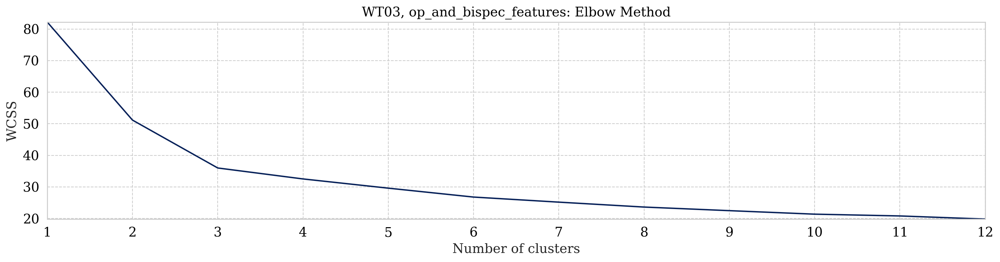

Did not replace


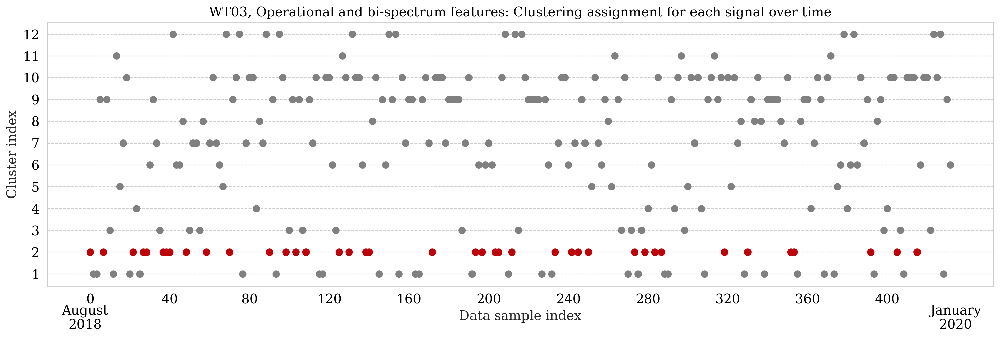

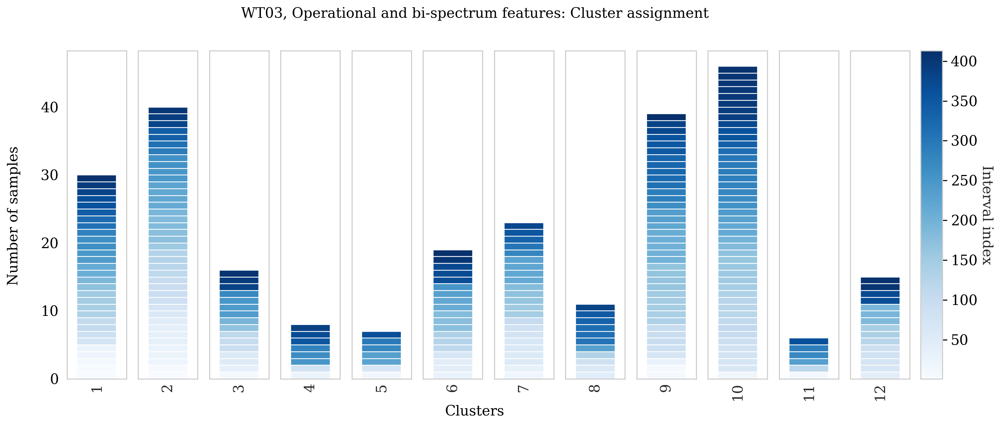

DIFFERENT HUES [ 1  2  3  4  5  6  7  8  9 10 11 12]


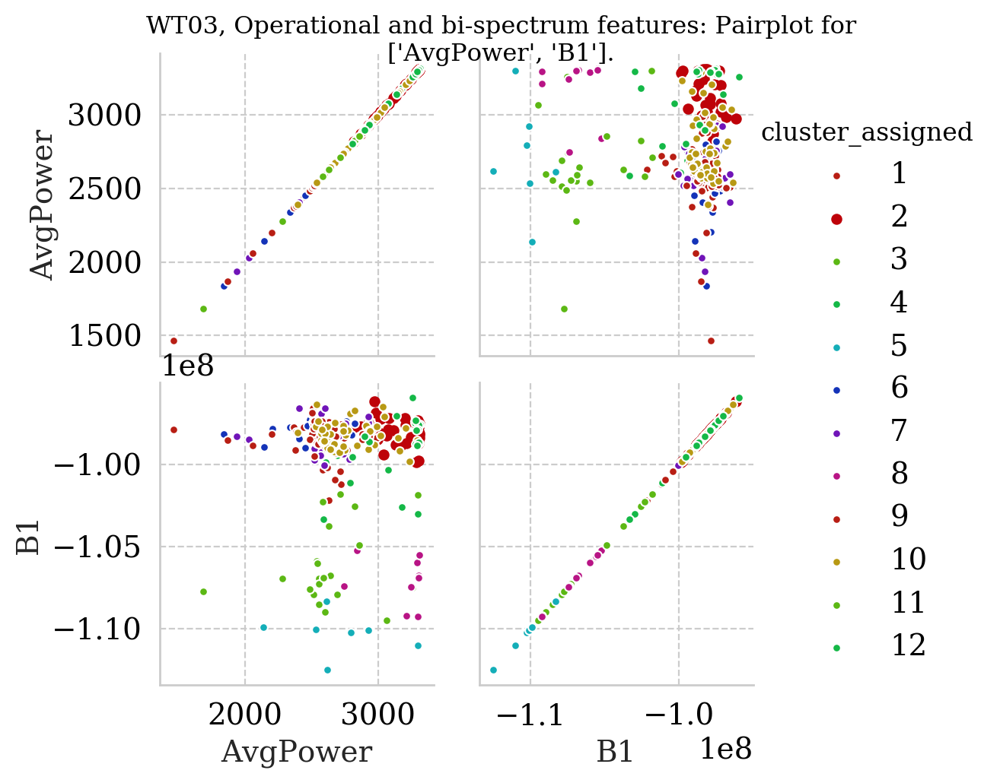

<span style="color: #2a9d8f; font-size: 20px">op_and_time_features:</span>

Marker-styles not there.


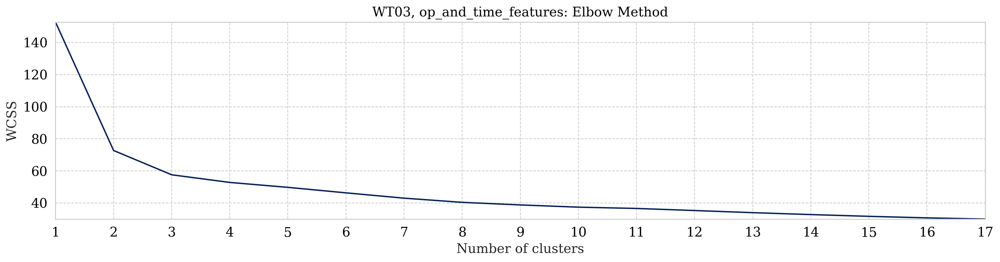

Did not replace


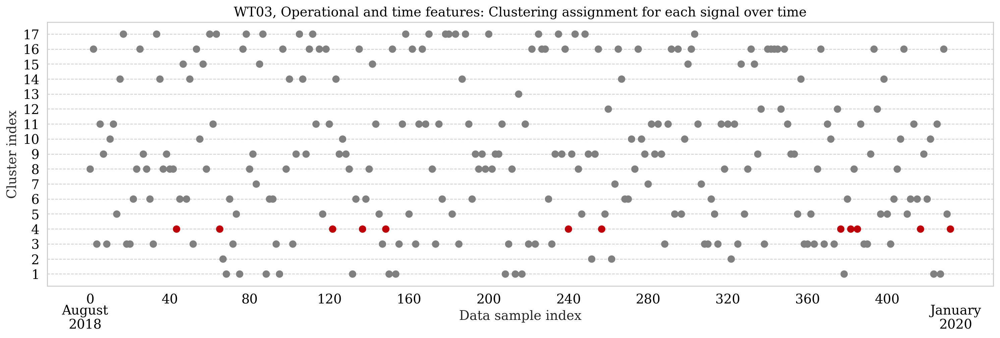

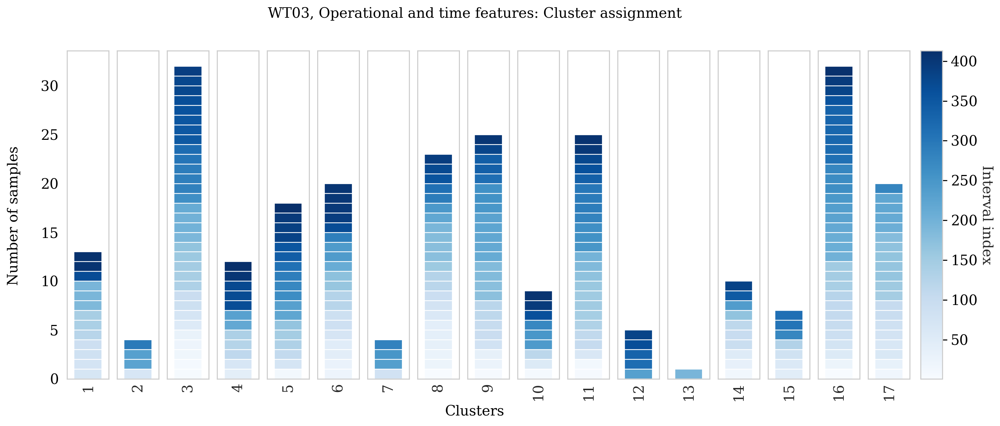

DIFFERENT HUES [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17]


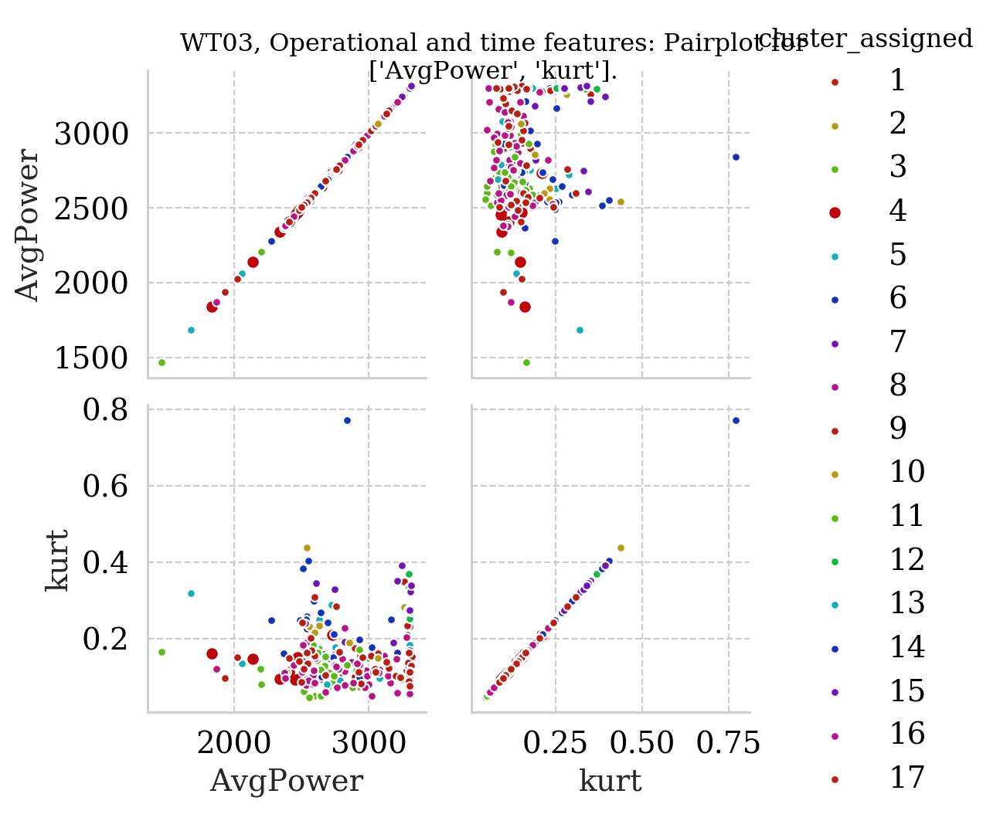

<span style="color: #2a9d8f; font-size: 20px">op_and_imf_kurtosis_features:</span>

Marker-styles not there.


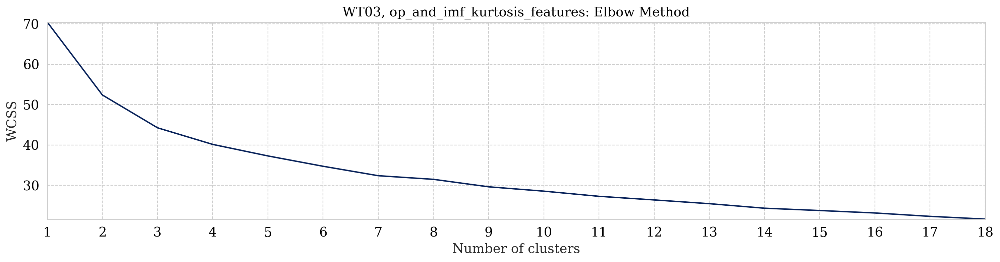

Did not replace


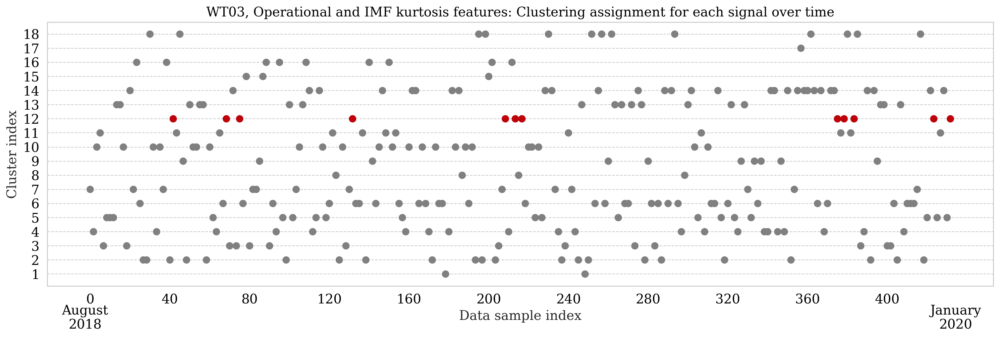

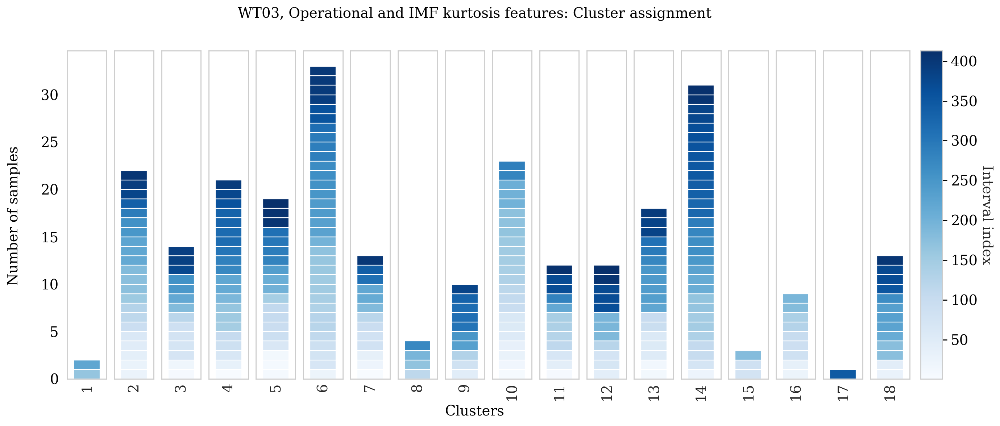

DIFFERENT HUES [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18]


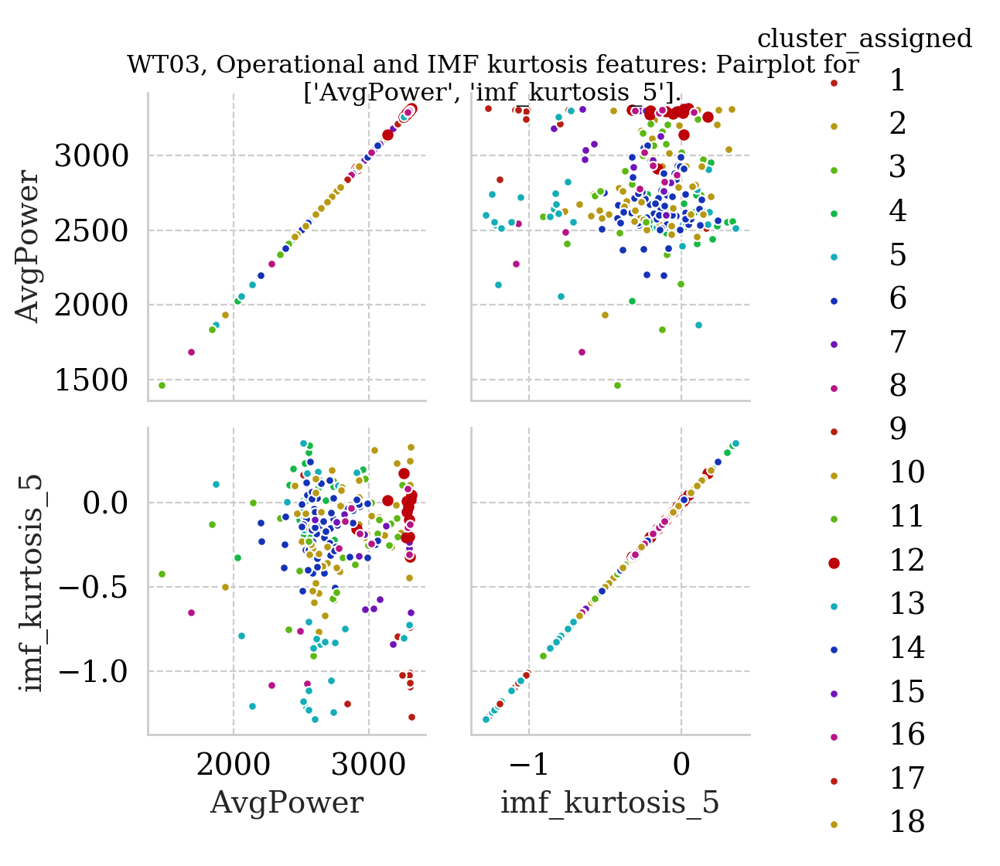

<span style="color: #2a9d8f; font-size: 20px">op_and_imf_features:</span>

Marker-styles not there.


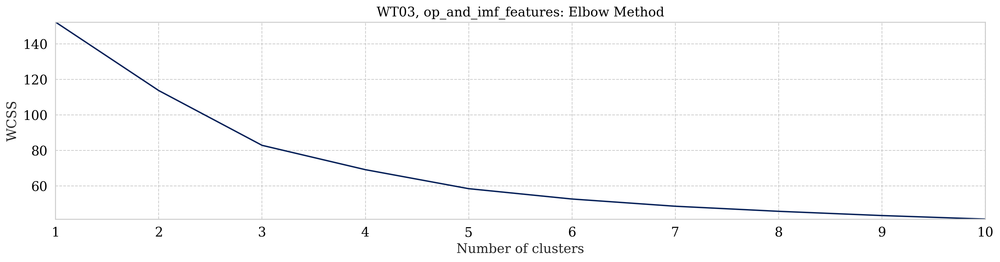

Did not replace


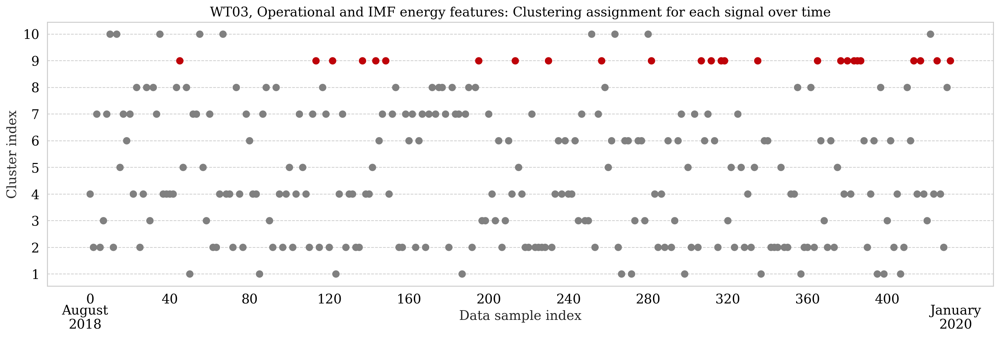

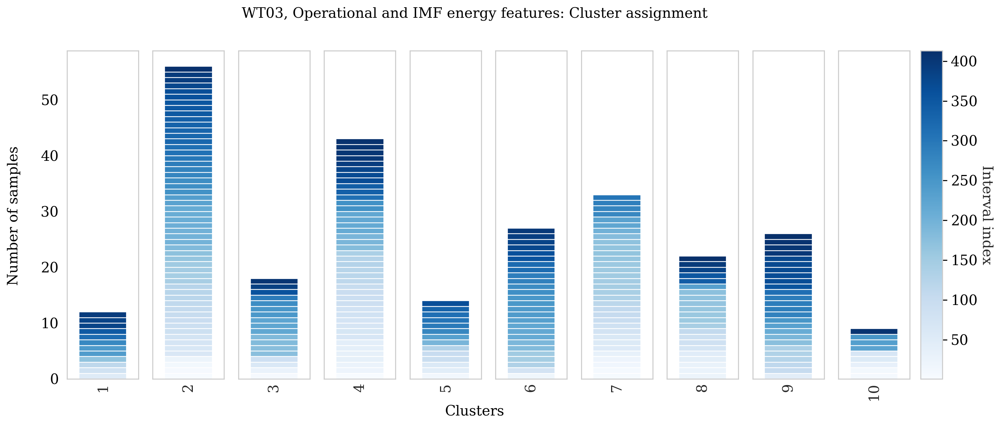

DIFFERENT HUES [ 1  2  3  4  5  6  7  8  9 10]


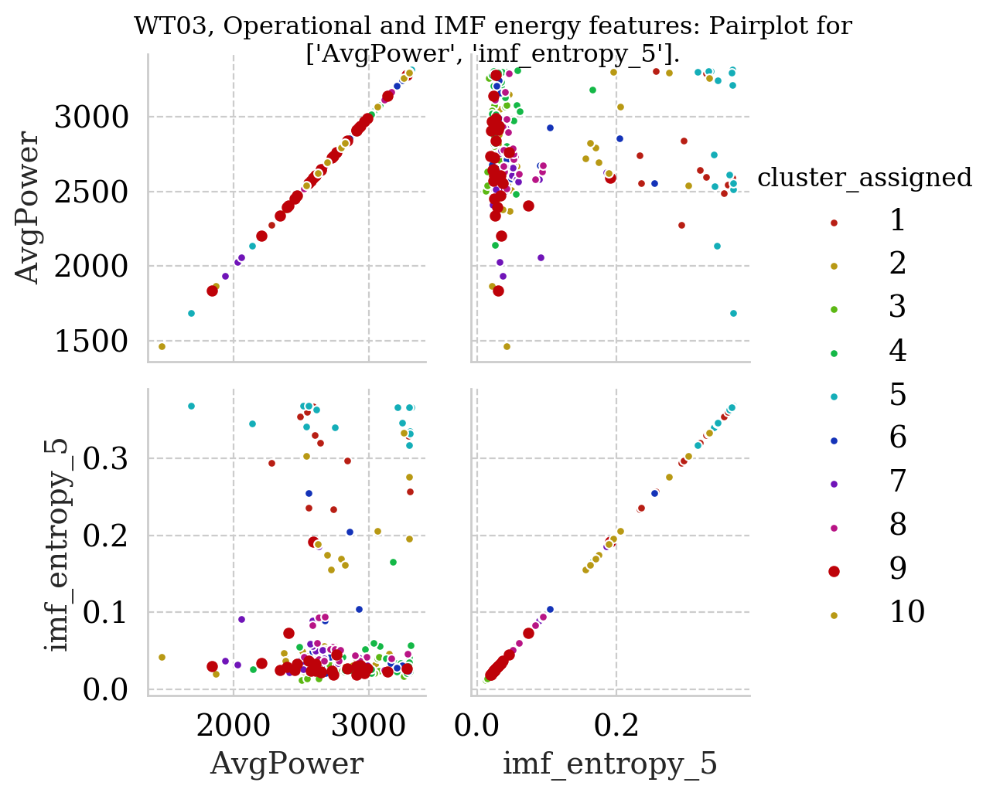

<span style="color: #2a9d8f; font-size: 20px">feature_mix:</span>

Marker-styles not there.


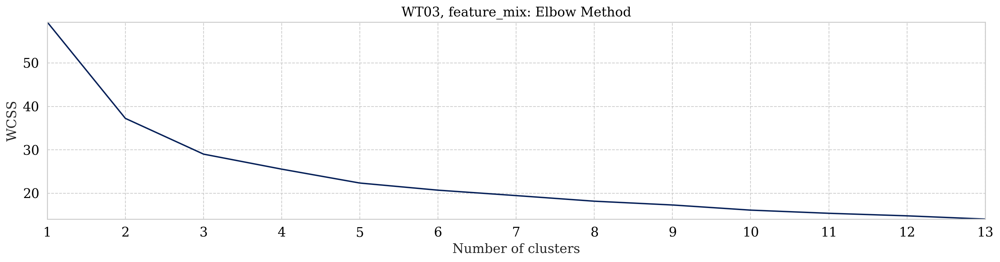

Did not replace


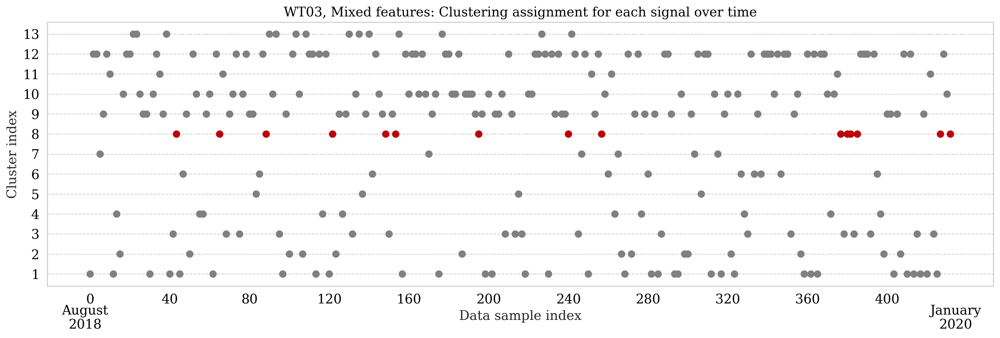

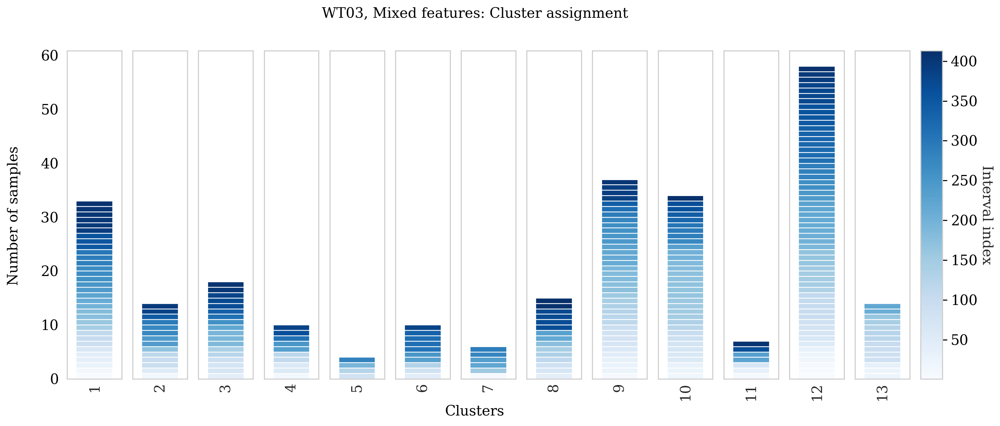

DIFFERENT HUES [ 1  2  3  4  5  6  7  8  9 10 11 12 13]


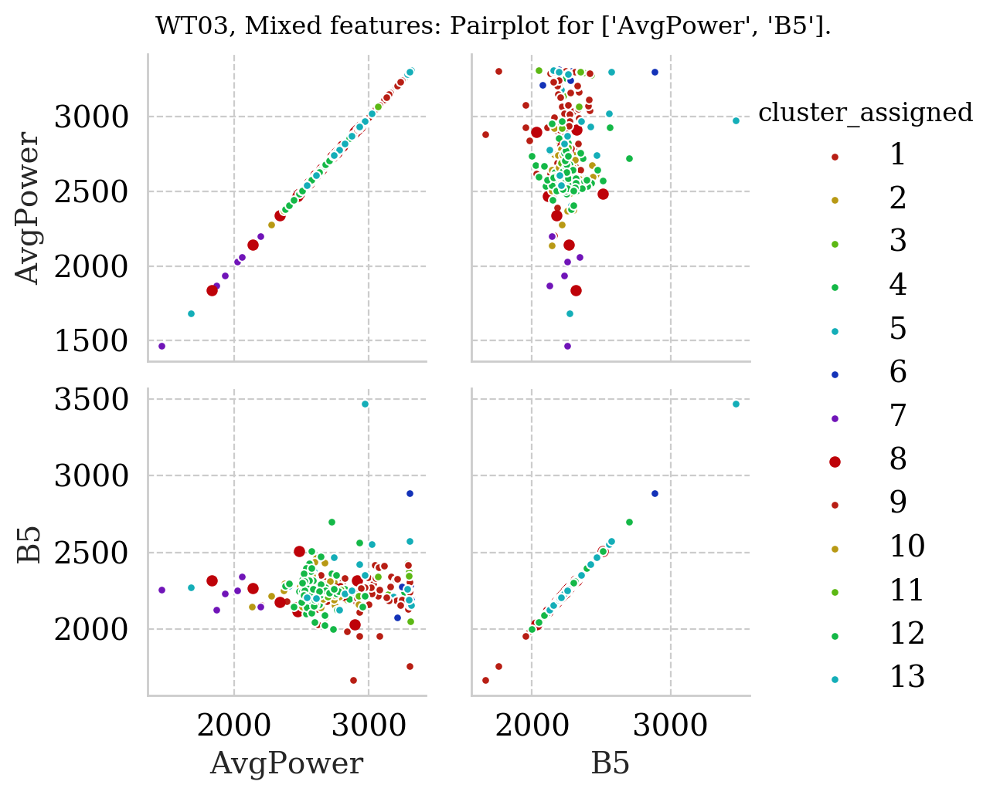

In [154]:


features_sets_titles= [
                'Operational and bi-spectrum features',
                'Operational and time features',
                'Operational and IMF kurtosis features',
                'Operational and IMF energy features',
                'Mixed features'
               ]

k_dictionary= {
    features_sets_names[0]: 12,
    features_sets_names[1]: 17,    
    features_sets_names[2]: 18,
    features_sets_names[3]: 10,
    features_sets_names[4]: 13,
}
fsets_for_printing=[
    ['AvgPower','B1'],
    ['AvgPower','kurt'],
    ['AvgPower','imf_kurtosis_5'],
    ['AvgPower','imf_entropy_5'],
    ['AvgPower','B5']]

selected_cluster_dict = {
    features_sets_names[0]: 1,
    features_sets_names[1]: 3,    
    features_sets_names[2]: 11,
    features_sets_names[3]: 8,
    features_sets_names[4]: 7,
}

print('wt_num_string:',wt_num_string)
for i,features in enumerate(features_sets):
    display(Markdown(f'<span style="color: #2a9d8f; font-size: 20px">{features_sets_names[i]}:</span>'))           
    
    assigned = run_kmeans(features_sets_titles[i],
                          wt_num_string,
                          features_sets_names[i],
                          features,
                          k_dictionary[features_sets_names[i]],
                          selected_cluster=selected_cluster_dict[features_sets_names[i]],
                          fset1=fsets_for_printing[i]
                         )

In [ ]:
print(wt_num_string)
assigned = run_kmeans('Complete data set',wt_num_string,'all_36_features',features,k_dictionary[features_sets_names[0]])


### Running through the different subsets of dataframes with dbscan

In [ ]:
import matplotlib
def plot_k_means_tuning(wt_num,df,feature_set_name):
    colormap = plt.cm.Blues
    normalize = matplotlib.colors.Normalize(vmin=-20, vmax=30)
    
    fig,ax=plt.subplots(figsize=(15,5))
    # df.plot.scatter(x='intervals_in_max_cluster',y='max_percentages',c='max_cluster_number',cmap='Blues',s=50,ax=ax)
    
    plt.scatter(df.intervals_in_max_cluster,df.max_percentages,s=100,c=df.max_cluster_number,cmap='Blues',norm=normalize)
    plt.colorbar()
    plt.clim(0,29)
    ax.set_ylabel('Percentage of intervals in cluster with Index > 350')
    ax.set_xlabel('Total number of intervals in cluster')
    ax.set_title(f'WT{wt_num}: Parameter tuning for K-means to tune number of later intervals isolated\n Feature set: {feature_set_name}')
    plt.show()

features_sets= [
                op_and_bispec_features,
                op_and_time_features,
                op_and_imf_kurtosis_features,
                op_and_imf_features
               ]

print('Features cleaned')
df=kmeans(wt_num_string,features_cleaned,30)
plot_k_means_tuning(df,'All features')

for i,features in enumerate(features_sets):
    print('*---------------------------------------------------------------*')
    print(features_sets_names[i])
    df=kmeans(features,30)
    display(df)
    plot_k_means_tuning(wt_num,df,features_sets_names[i])
    plt.show()    

In [ ]:
# How many sampels are in the last 50 intervals?
features_cleaned[features_cleaned['Index']>350].count()

In [ ]:
# Dropping the time subset.
drop_time=pd.concat([operating_features,bispectrum_features,imf_features,imf_kurt_features],axis=1)

In [ ]:
SELECTED_FEATURES=drop_time

df=kmeans(SELECTED_FEATURES,7)
display(df)
text=df.to_latex(index=True)
# plot_k_means_tuning(df,'All features except time.')
text

In [ ]:
myDict = {}
y_cluster_kmeans=cluster_labels
min_clus = y_cluster_kmeans.min()


def map_index(index,feature_df):
    result=feature_df.iloc[index,:]['Index']
    return result


if not (min_clus == 0):
    if min_clus < 0:
        y_cluster_kmeans = y_cluster_kmeans + (min_clus*-1 )    
    elif min_clus > 0:
        y_cluster_kmeans = y_cluster_kmeans - min_clus
    min_clus = 0
# Placing the clustered points in cluster lists (where the lists in each key contain indexes)
for i, elem in enumerate(y_cluster_kmeans):
    if (elem in myDict):
        myDict[elem].append(i)
    else:
        myDict[elem] = [i]

for i in range(min_clus,len(myDict)): # Sorting the dictionaries
    np.sort(myDict[i])

# MAP THEM OVER TO NORMAL INDEX!

for i in range(min_clus,len(myDict)): # map these indexes to the actual indexes in the interval.
        index_list=myDict[i]
        new_list=[]
        for j,elem in enumerate(index_list):
            new_list.append(int(map_index(elem,features_cleaned)))
        myDict[i]=new_list



print(myDict[2])
    
for i in range(len(myDict)):
    ax=sns.kdeplot(myDict[i], shade=True,);   
    ax.set_ylim(0,0.007)
    ax.set_title(f'Cluster number {i+1}')
    
    # sns.distplot(myDict[i], bins=20, kde=False, rug=True);
    #plt.show()

    

In [ ]:
def db_scan_raw(SELECTED_FEATURES,min_samples_max,eps_range_max,kind='raw'):
    '''
    Extract paramaters to optimize the DB scan.
    
    Args:
        SELECTED_FEATURES (pd.DataFrame): Df with ml features to cluster. Should be MinMaxScaled!
        min_samples_max (int): States the max number of intervals (points) needed to form a cluster.
        eps_range_max (int): States the max distance to neighbouring point which is included in same cluster.
    Returns:
        df (pd.DataFrame): Containing stats on the cluster with the highest amount of indexes > 350.
    '''
    min_samples_range = np.arange(5,min_samples_max)
    eps_range = np.linspace(0.3,eps_range_max,50)#100

    eps_res = []
    uniques_array = []
    min_samples_array=[] # Array with ints that state how many intervals is required to form a cluster
    intervals_in_max_cluster=[]
    max_percentages=[]
    final_df = []
    for i in tqdm(min_samples_range):
        for j,eps in enumerate(eps_range):
            cluster_labels, cluster_map = clustering.db_scan_clustering(SELECTED_FEATURES,kind,eps=eps,min_samples=i,plot=False) # Cluster the points
            clusterDict = clustering.plot_clusters(cluster_labels,SELECTED_FEATURES,False)
            cluster_stats_df=calculate_cluster_stats(clusterDict)

            # the cluster with max intervals greater that 350
            max_percentage=(cluster_stats_df['percentage_intervals_greater_than_350'].max()) 
            # Find the row with this max_percentage
            temp=cluster_stats_df[cluster_stats_df['percentage_intervals_greater_than_350']==max_percentage]


            # Extract the number of intervals in this cluster 
            interval_in_cluster = (temp['number_of_intervals_in_cluster'].max())

            eps_res.append(eps)
            min_samples_array.append(i) 
            intervals_in_max_cluster.append(interval_in_cluster)
            max_percentages.append(max_percentage)

    final_df.append(eps_res)
    final_df.append(min_samples_array)
    final_df.append(intervals_in_max_cluster)
    final_df.append(max_percentages)
    
    final_df=np.asarray(final_df)
    
    print(final_df.shape)
    final_df=pd.DataFrame(final_df.T,columns=['eps','samples_needed_to_form_cluster','intervals_in_max_cluster','max_percentages'])
    return final_df

assert features_cleaned.shape[0] == 260 # make sure noise is removed!

#SELECTED_FEATURES=features_cleaned
#eps_range_max= 1
#min_samples_max=11

#df=db_scan_raw(SELECTED_FEATURES,min_samples_max,eps_range_max)
#fig,ax=plt.subplots()
#df.plot.scatter(x='eps',y='samples_needed_to_form_cluster',c='max_percentages',cmap='Blues',s=50,ax=ax)
#ax.set_ylabel('samples_needed_to_form_cluster')
#ax.set_xlabel('eps')
#maximum = df['max_percentages'].max()
#rows=df[df['max_percentages']==maximum]


for i,features in enumerate(features_sets):
    print('*---------------------------------------------------------------*')
    print(features_sets_names[i])

    SELECTED_FEATURES=features
    eps_range_max= 0.7
    min_samples_max=10
    df=db_scan_raw(SELECTED_FEATURES,min_samples_max,eps_range_max)
    #pandas.set_option('display.max_rows', df.shape[0]+1)
    #display(df)
    display(df)
    fig,ax=plt.subplots()
    df.plot.scatter(x='samples_needed_to_form_cluster',y='eps',c='max_percentages',cmap='Blues',s=50,ax=ax)
    ax.set_ylabel('eps')
    ax.set_xlabel('samples_needed_to_form_cluster')
    ax.set_title('8 PCA components')
    plt.show()
    '''
    optimized_eps=1
    optimized_min_samples=4

    cluster_labels, cluster_map = clustering.db_scan_clustering(SELECTED_FEATURES,'raw',eps=optimized_eps,min_samples=optimized_min_samples,plot=True) # Cluster the points
    cluster_dict=clustering.plot_clusters(cluster_labels,SELECTED_FEATURES) # plot the clusters
    clustering.plot_clusters_pair_plot(features_cleaned, ['AvgSpeed','rms','B4'],cluster_labels) # pair plot 1
    clustering.plot_clusters_pair_plot(features_cleaned, ['AvgPower','AvgSpeed','imf_entropy_4', 'imf_entropy_5','B4'],cluster_labels) # pair plot 2
    df=calculate_cluster_stats(cluster_dict) 
    '''